In [1]:
# ============================================================
# HISTOPATHOLOGY DATASET INSPECTION
# ============================================================

from pathlib import Path
import pandas as pd
import os

# ------------------------------------------------------------
# 1. Define dataset paths
# ------------------------------------------------------------

# Change this path only if your files are stored elsewhere
DATASET_DIR = Path(".")

IMAGE_DIR = DATASET_DIR / "histopathological images"
CSV_PATH = DATASET_DIR / "ndb-ufes.csv"

print("=" * 70)
print("DATASET PATH CHECK")
print("=" * 70)

print("Current working directory:", Path.cwd())
print("Image folder:", IMAGE_DIR.resolve())
print("CSV file:", CSV_PATH.resolve())

if not IMAGE_DIR.exists():
    raise FileNotFoundError(
        f"Image folder not found: {IMAGE_DIR}\n"
        "Check the folder name and path."
    )

if not CSV_PATH.exists():
    raise FileNotFoundError(
        f"CSV file not found: {CSV_PATH}\n"
        "Check the CSV filename and path."
    )

# ------------------------------------------------------------
# 2. Load CSV
# ------------------------------------------------------------

df = pd.read_csv(CSV_PATH)

print("\n" + "=" * 70)
print("CSV INFORMATION")
print("=" * 70)

print("Number of rows:", len(df))
print("Number of columns:", len(df.columns))

print("\nCSV column names:")
for i, column in enumerate(df.columns):
    print(f"{i + 1}. {column}")

print("\nFirst 10 rows:")
display(df.head(10))

print("\nData types:")
display(df.dtypes)

# ------------------------------------------------------------
# 3. Display unique values of every column
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("UNIQUE VALUES OF EVERY COLUMN")
print("=" * 70)

for column in df.columns:
    print(f"\nColumn: {column}")
    print("Number of unique values:", df[column].nunique(dropna=False))

    unique_values = df[column].drop_duplicates().head(30).tolist()
    print("Sample unique values:", unique_values)

# ------------------------------------------------------------
# 4. Find image files
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("IMAGE FILE INFORMATION")
print("=" * 70)

image_extensions = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

image_files = sorted(
    [
        file for file in IMAGE_DIR.rglob("*")
        if file.is_file() and file.suffix.lower() in image_extensions
    ]
)

print("Number of image files found:", len(image_files))

print("\nFirst 20 image filenames:")
for image_file in image_files[:20]:
    print(image_file.name)

# ------------------------------------------------------------
# 5. Generate possible filename and label column candidates
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("POSSIBLE FILENAME AND LABEL COLUMNS")
print("=" * 70)

filename_keywords = [
    "image", "img", "file", "filename", "file_name",
    "name", "path", "id"
]

label_keywords = [
    "label", "class", "target", "diagnosis",
    "category", "type", "status", "cancer",
    "tumor", "lesion"
]

filename_candidates = []
label_candidates = []

for column in df.columns:
    column_lower = str(column).lower()

    if any(keyword in column_lower for keyword in filename_keywords):
        filename_candidates.append(column)

    if any(keyword in column_lower for keyword in label_keywords):
        label_candidates.append(column)

print("Possible image filename columns:")
print(filename_candidates)

print("\nPossible label columns:")
print(label_candidates)

# ------------------------------------------------------------
# 6. Check whether CSV values match actual image filenames
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("CSV-IMAGE FILENAME MATCHING")
print("=" * 70)

actual_image_names = {file.name for file in image_files}
actual_image_stems = {file.stem for file in image_files}

matching_results = []

for column in df.columns:
    values = df[column].dropna().astype(str).str.strip()

    if len(values) == 0:
        continue

    exact_filename_matches = values.isin(actual_image_names).sum()
    stem_matches = values.isin(actual_image_stems).sum()

    matching_results.append({
        "column": column,
        "exact_filename_matches": int(exact_filename_matches),
        "stem_matches": int(stem_matches),
        "non_null_values": len(values),
        "unique_values": values.nunique()
    })

matching_df = pd.DataFrame(matching_results)

if not matching_df.empty:
    matching_df = matching_df.sort_values(
        by=["exact_filename_matches", "stem_matches"],
        ascending=False
    )

    display(matching_df)

# ------------------------------------------------------------
# 7. Automatically inspect the best filename candidate
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FILENAME COLUMN ANALYSIS")
print("=" * 70)

best_filename_column = None

if not matching_df.empty:
    best_row = matching_df.iloc[0]

    if (
        best_row["exact_filename_matches"] > 0
        or best_row["stem_matches"] > 0
    ):
        best_filename_column = best_row["column"]

if best_filename_column is None:
    print("Could not confidently identify the image filename column.")
else:
    print("Most likely image filename column:", best_filename_column)

    filename_values = (
        df[best_filename_column]
        .dropna()
        .astype(str)
        .str.strip()
    )

    exact_matches = filename_values[
        filename_values.isin(actual_image_names)
    ]

    stem_matches = filename_values[
        filename_values.isin(actual_image_stems)
    ]

    print("Exact filename matches:", len(exact_matches))
    print("Image stem matches:", len(stem_matches))

    print("\nSample CSV filename values:")
    display(filename_values.head(20))

    print("\nCSV filenames not found in image folder:")
    unmatched = filename_values[
        ~filename_values.isin(actual_image_names)
        & ~filename_values.isin(actual_image_stems)
    ]

    display(unmatched.head(20))

# ------------------------------------------------------------
# 8. Display possible label columns with their distributions
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("LABEL COLUMN ANALYSIS")
print("=" * 70)

if len(label_candidates) == 0:
    print("No obvious label column was detected from the column names.")
else:
    print("Possible label columns:", label_candidates)

    for column in label_candidates:
        print(f"\nLabel candidate: {column}")
        print("Unique values:")
        print(df[column].value_counts(dropna=False))

# ------------------------------------------------------------
# 9. Final decision report
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL INSPECTION REPORT")
print("=" * 70)

if best_filename_column is None:
    print("STATUS: STOP")
    print("Reason: Image filename column is ambiguous.")
else:
    best_row = matching_df.iloc[0]

    if (
        best_row["exact_filename_matches"] == 0
        and best_row["stem_matches"] == 0
    ):
        print("STATUS: STOP")
        print("Reason: CSV filenames do not match image filenames.")
    elif len(label_candidates) == 0:
        print("STATUS: STOP")
        print("Reason: Label column is ambiguous.")
    elif len(label_candidates) > 1:
        print("STATUS: REVIEW REQUIRED")
        print("More than one possible label column was found.")
        print("Possible label columns:", label_candidates)
    else:
        print("STATUS: FURTHER REVIEW REQUIRED")
        print("Most likely filename column:", best_filename_column)
        print("Possible label column:", label_candidates[0])
        print("Do not train until the label mapping is manually confirmed.")

print("\nInspection complete. No model training was performed.")

DATASET PATH CHECK
Current working directory: /content
Image folder: /content/histopathological images
CSV file: /content/ndb-ufes.csv

CSV INFORMATION
Number of rows: 237
Number of columns: 17

CSV column names:
1. public_id
2. lesion_id
3. patient_id
4. path
5. localization
6. larger_size
7. tobacco_use
8. alcohol_consumption
9. sun_exposure
10. gender
11. skin_color
12. age_group
13. diagnosis
14. dysplasia_severity
15. TaskII
16. TaskIII
17. TaskIV

First 10 rows:


,public_id,lesion_id,patient_id,path,localization,larger_size,tobacco_use,alcohol_consumption,sun_exposure,gender,skin_color,age_group,diagnosis,dysplasia_severity,TaskII,TaskIII,TaskIV
0,0,50,48,0000.png,Tongue,2.0,Yes,No,No,M,Black,2,OSCC,NaN,OSCC,Presence,OSCC
1,1,50,48,0001.png,Tongue,2.0,Yes,No,No,M,Black,2,OSCC,NaN,OSCC,Presence,OSCC
2,2,41,39,0002.png,Tongue,2.5,Yes,Former,Yes,M,White,1,OSCC,NaN,OSCC,Presence,OSCC
3,3,41,39,0003.png,Tongue,2.5,Yes,Former,Yes,M,White,1,OSCC,NaN,OSCC,Presence,OSCC
4,4,87,81,0004.png,Lip,1.5,Former,Yes,Yes,F,White,2,OSCC,NaN,OSCC,Presence,OSCC
5,5,87,81,0005.png,Lip,1.5,Former,Yes,Yes,F,White,2,OSCC,NaN,OSCC,Presence,OSCC
6,6,103,78,0006.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia
7,7,103,78,0007.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia
8,8,103,78,0008.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia
9,9,103,78,0009.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia



Data types:


,0
public_id,int64
lesion_id,int64
patient_id,int64
path,object
localization,object
larger_size,float64
tobacco_use,object
alcohol_consumption,object
sun_exposure,object
gender,object



UNIQUE VALUES OF EVERY COLUMN

Column: public_id
Number of unique values: 237
Sample unique values: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]

Column: lesion_id
Number of unique values: 77
Sample unique values: [50, 41, 87, 103, 101, 54, 129, 11, 22, 68, 58, 77, 102, 33, 96, 84, 106, 53, 88, 130, 15, 64, 104, 24, 73, 31, 30, 42, 6, 27]

Column: patient_id
Number of unique values: 69
Sample unique values: [48, 39, 81, 78, 14, 52, 24, 10, 20, 63, 55, 71, 31, 90, 51, 82, 13, 60, 22, 67, 28, 27, 40, 6, 25, 72, 16, 77, 68, 89]

Column: path
Number of unique values: 237
Sample unique values: ['0000.png', '0001.png', '0002.png', '0003.png', '0004.png', '0005.png', '0006.png', '0007.png', '0008.png', '0009.png', '0010.png', '0011.png', '0012.png', '0013.png', '0014.png', '0015.png', '0016.png', '0017.png', '0018.png', '0019.png', '0020.png', '0021.png', '0022.png', '0023.png', '0024.png', '0025.png', '0026.png', '0027.png', 

,column,exact_filename_matches,stem_matches,non_null_values,unique_values
3,path,237,0,237,237
0,public_id,0,0,237,237
1,lesion_id,0,0,237,77
2,patient_id,0,0,237,69
4,localization,0,0,237,6
5,larger_size,0,0,237,20
6,tobacco_use,0,0,237,4
7,alcohol_consumption,0,0,237,4
8,sun_exposure,0,0,237,3
9,gender,0,0,237,2



FILENAME COLUMN ANALYSIS
Most likely image filename column: path
Exact filename matches: 237
Image stem matches: 0

Sample CSV filename values:


,path
0,0000.png
1,0001.png
2,0002.png
3,0003.png
4,0004.png
5,0005.png
6,0006.png
7,0007.png
8,0008.png
9,0009.png



CSV filenames not found in image folder:


,path



LABEL COLUMN ANALYSIS
Possible label columns: ['lesion_id', 'diagnosis']

Label candidate: lesion_id
Unique values:
lesion_id
47     8
78     8
104    6
23     6
89     6
      ..
193    2
194    2
195    2
215    2
216    2
Name: count, Length: 77, dtype: int64

Label candidate: diagnosis
Unique values:
diagnosis
OSCC                             91
Leukoplakia with dysplasia       89
Leukoplakia without dysplasia    57
Name: count, dtype: int64

FINAL INSPECTION REPORT
STATUS: REVIEW REQUIRED
More than one possible label column was found.
Possible label columns: ['lesion_id', 'diagnosis']

Inspection complete. No model training was performed.


In [2]:
# ============================================================
# PROMPT 1: HISTOPATHOLOGY DATASET INSPECTION
# ============================================================

from pathlib import Path
import pandas as pd
from PIL import Image
from IPython.display import display

# ------------------------------------------------------------
# 1. Set paths
# ------------------------------------------------------------

DATASET_DIR = Path(".")
IMAGE_DIR = DATASET_DIR / "histopathological images"
CSV_PATH = DATASET_DIR / "ndb-ufes.csv"

print("=" * 80)
print("HISTOPATHOLOGY DATASET INSPECTION")
print("=" * 80)

print("Current working directory:", Path.cwd())
print("Image folder:", IMAGE_DIR.resolve())
print("CSV file:", CSV_PATH.resolve())

if not IMAGE_DIR.exists():
    raise FileNotFoundError(
        f"Image folder not found: {IMAGE_DIR}\n"
        "Check the folder name or update IMAGE_DIR."
    )

if not CSV_PATH.exists():
    raise FileNotFoundError(
        f"CSV file not found: {CSV_PATH}\n"
        "Check the CSV filename or update CSV_PATH."
    )

# ------------------------------------------------------------
# 2. Load CSV
# ------------------------------------------------------------

df = pd.read_csv(CSV_PATH)

print("\n" + "=" * 80)
print("1. CSV COLUMN NAMES")
print("=" * 80)

print(list(df.columns))

print("\n" + "=" * 80)
print("2. FIRST 10 ROWS")
print("=" * 80)

display(df.head(10))

print("\n" + "=" * 80)
print("3. NUMBER OF CSV ROWS")
print("=" * 80)

print("Total rows:", len(df))
print("Total columns:", len(df.columns))

# ------------------------------------------------------------
# 3. Unique values of every column
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("4. UNIQUE VALUES OF EVERY POSSIBLE LABEL COLUMN")
print("=" * 80)

for column in df.columns:
    print(f"\nColumn: {column}")
    print("Data type:", df[column].dtype)
    print("Number of unique values:", df[column].nunique(dropna=False))

    # Display up to 30 unique values
    unique_values = df[column].drop_duplicates().head(30).tolist()
    print("Sample unique values:", unique_values)

# ------------------------------------------------------------
# 4. Find all image files
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("5. IMAGE FILENAME INFORMATION")
print("=" * 80)

valid_extensions = {
    ".png",
    ".jpg",
    ".jpeg",
    ".bmp",
    ".tif",
    ".tiff"
}

image_files = sorted([
    file for file in IMAGE_DIR.rglob("*")
    if file.is_file()
    and file.suffix.lower() in valid_extensions
])

actual_image_names = {file.name for file in image_files}
actual_image_stems = {file.stem for file in image_files}

print("Total image files found:", len(image_files))

print("\nFirst 20 image filenames:")
for file in image_files[:20]:
    print(file.name)

# ------------------------------------------------------------
# 5. Detect possible filename and label columns
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("6. POSSIBLE FILENAME AND LABEL COLUMNS")
print("=" * 80)

filename_keywords = [
    "image",
    "img",
    "file",
    "filename",
    "file_name",
    "name",
    "path",
    "id"
]

label_keywords = [
    "label",
    "class",
    "target",
    "diagnosis",
    "category",
    "type",
    "status",
    "cancer",
    "tumor",
    "lesion"
]

filename_candidates = []
label_candidates = []

for column in df.columns:
    column_lower = str(column).lower().strip()

    if any(keyword in column_lower for keyword in filename_keywords):
        filename_candidates.append(column)

    if any(keyword in column_lower for keyword in label_keywords):
        label_candidates.append(column)

print("Possible filename columns:")
print(filename_candidates)

print("\nPossible label columns:")
print(label_candidates)

# ------------------------------------------------------------
# 6. Check CSV columns against actual image filenames
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("7. CSV FILENAME MATCHING REPORT")
print("=" * 80)

matching_results = []

for column in df.columns:

    values = (
        df[column]
        .dropna()
        .astype(str)
        .str.strip()
    )

    if len(values) == 0:
        continue

    exact_filename_matches = values.isin(actual_image_names).sum()
    stem_matches = values.isin(actual_image_stems).sum()

    matching_results.append({
        "column": column,
        "non_null_values": len(values),
        "unique_values": values.nunique(),
        "exact_filename_matches": int(exact_filename_matches),
        "image_stem_matches": int(stem_matches)
    })

matching_df = pd.DataFrame(matching_results)

if matching_df.empty:
    print("No columns available for filename matching.")
else:
    matching_df = matching_df.sort_values(
        by=[
            "exact_filename_matches",
            "image_stem_matches"
        ],
        ascending=False
    )

    display(matching_df)

# ------------------------------------------------------------
# 7. Analyze the most likely filename column
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("8. MOST LIKELY IMAGE FILENAME COLUMN")
print("=" * 80)

best_filename_column = None

if not matching_df.empty:

    best_row = matching_df.iloc[0]

    if (
        best_row["exact_filename_matches"] > 0
        or best_row["image_stem_matches"] > 0
    ):
        best_filename_column = best_row["column"]

if best_filename_column is None:

    print("Could not confidently identify the filename column.")

else:

    print("Most likely filename column:", best_filename_column)

    csv_filenames = (
        df[best_filename_column]
        .dropna()
        .astype(str)
        .str.strip()
    )

    exact_matches = csv_filenames[
        csv_filenames.isin(actual_image_names)
    ]

    stem_matches = csv_filenames[
        csv_filenames.isin(actual_image_stems)
    ]

    unmatched_filenames = csv_filenames[
        ~csv_filenames.isin(actual_image_names)
        & ~csv_filenames.isin(actual_image_stems)
    ]

    print("Exact filename matches:", len(exact_matches))
    print("Image stem matches:", len(stem_matches))
    print("Unmatched CSV filenames:", len(unmatched_filenames))

    print("\nSample CSV filename values:")
    display(csv_filenames.head(20))

    print("\nSample unmatched filenames:")
    display(unmatched_filenames.head(20))

# ------------------------------------------------------------
# 8. Analyze possible label columns
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("9. POSSIBLE LABEL COLUMN DISTRIBUTIONS")
print("=" * 80)

if len(label_candidates) == 0:

    print("No obvious label column was detected.")

else:

    for column in label_candidates:

        print(f"\nLabel candidate: {column}")
        print("Number of unique values:", df[column].nunique(dropna=False))
        print("Value distribution:")

        display(df[column].value_counts(dropna=False))

# ------------------------------------------------------------
# 9. Check duplicate and missing values
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("10. DATA QUALITY CHECKS")
print("=" * 80)

print("Duplicate CSV rows:", df.duplicated().sum())
print("Missing values by column:")

display(df.isnull().sum())

if best_filename_column is not None:

    print(
        "Duplicate values in possible filename column:",
        df[best_filename_column].duplicated().sum()
    )

# ------------------------------------------------------------
# 10. Final status report
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FINAL STATUS REPORT")
print("=" * 80)

if best_filename_column is None:

    print("STATUS: STOP")
    print("Reason: Image filename column is ambiguous.")

elif matching_df.iloc[0]["exact_filename_matches"] == 0 and \
     matching_df.iloc[0]["image_stem_matches"] == 0:

    print("STATUS: STOP")
    print("Reason: CSV filenames do not match actual image filenames.")

elif len(label_candidates) == 0:

    print("STATUS: STOP")
    print("Reason: Label column is ambiguous.")

elif len(label_candidates) > 1:

    print("STATUS: REVIEW REQUIRED")
    print("More than one possible label column was detected.")
    print("Possible label columns:", label_candidates)

else:

    print("STATUS: FURTHER REVIEW REQUIRED")
    print("Possible filename column:", best_filename_column)
    print("Possible label column:", label_candidates[0])
    print("Confirm the columns before training.")

print("\nNo model training was performed.")
print("Dataset inspection completed.")

HISTOPATHOLOGY DATASET INSPECTION
Current working directory: /content
Image folder: /content/histopathological images
CSV file: /content/ndb-ufes.csv

1. CSV COLUMN NAMES
['public_id', 'lesion_id', 'patient_id', 'path', 'localization', 'larger_size', 'tobacco_use', 'alcohol_consumption', 'sun_exposure', 'gender', 'skin_color', 'age_group', 'diagnosis', 'dysplasia_severity', 'TaskII', 'TaskIII', 'TaskIV']

2. FIRST 10 ROWS


,public_id,lesion_id,patient_id,path,localization,larger_size,tobacco_use,alcohol_consumption,sun_exposure,gender,skin_color,age_group,diagnosis,dysplasia_severity,TaskII,TaskIII,TaskIV
0,0,50,48,0000.png,Tongue,2.0,Yes,No,No,M,Black,2,OSCC,NaN,OSCC,Presence,OSCC
1,1,50,48,0001.png,Tongue,2.0,Yes,No,No,M,Black,2,OSCC,NaN,OSCC,Presence,OSCC
2,2,41,39,0002.png,Tongue,2.5,Yes,Former,Yes,M,White,1,OSCC,NaN,OSCC,Presence,OSCC
3,3,41,39,0003.png,Tongue,2.5,Yes,Former,Yes,M,White,1,OSCC,NaN,OSCC,Presence,OSCC
4,4,87,81,0004.png,Lip,1.5,Former,Yes,Yes,F,White,2,OSCC,NaN,OSCC,Presence,OSCC
5,5,87,81,0005.png,Lip,1.5,Former,Yes,Yes,F,White,2,OSCC,NaN,OSCC,Presence,OSCC
6,6,103,78,0006.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia
7,7,103,78,0007.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia
8,8,103,78,0008.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia
9,9,103,78,0009.png,Tongue,0.4,No,Yes,No,F,White,1,Leukoplakia with dysplasia,Mild,Leukoplakia,Presence,Leukoplakia with dysplasia



3. NUMBER OF CSV ROWS
Total rows: 237
Total columns: 17

4. UNIQUE VALUES OF EVERY POSSIBLE LABEL COLUMN

Column: public_id
Data type: int64
Number of unique values: 237
Sample unique values: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]

Column: lesion_id
Data type: int64
Number of unique values: 77
Sample unique values: [50, 41, 87, 103, 101, 54, 129, 11, 22, 68, 58, 77, 102, 33, 96, 84, 106, 53, 88, 130, 15, 64, 104, 24, 73, 31, 30, 42, 6, 27]

Column: patient_id
Data type: int64
Number of unique values: 69
Sample unique values: [48, 39, 81, 78, 14, 52, 24, 10, 20, 63, 55, 71, 31, 90, 51, 82, 13, 60, 22, 67, 28, 27, 40, 6, 25, 72, 16, 77, 68, 89]

Column: path
Data type: object
Number of unique values: 237
Sample unique values: ['0000.png', '0001.png', '0002.png', '0003.png', '0004.png', '0005.png', '0006.png', '0007.png', '0008.png', '0009.png', '0010.png', '0011.png', '0012.png', '0013.png', '0014.png', '0015.png', 

,column,non_null_values,unique_values,exact_filename_matches,image_stem_matches
3,path,237,237,237,0
0,public_id,237,237,0,0
1,lesion_id,237,77,0,0
2,patient_id,237,69,0,0
4,localization,237,6,0,0
5,larger_size,237,20,0,0
6,tobacco_use,237,4,0,0
7,alcohol_consumption,237,4,0,0
8,sun_exposure,237,3,0,0
9,gender,237,2,0,0



8. MOST LIKELY IMAGE FILENAME COLUMN
Most likely filename column: path
Exact filename matches: 237
Image stem matches: 0
Unmatched CSV filenames: 0

Sample CSV filename values:


,path
0,0000.png
1,0001.png
2,0002.png
3,0003.png
4,0004.png
5,0005.png
6,0006.png
7,0007.png
8,0008.png
9,0009.png



Sample unmatched filenames:


,path



9. POSSIBLE LABEL COLUMN DISTRIBUTIONS

Label candidate: lesion_id
Number of unique values: 77
Value distribution:


,count
lesion_id,
47,8
78,8
104,6
23,6
89,6
...,...
193,2
194,2
195,2



Label candidate: diagnosis
Number of unique values: 3
Value distribution:


,count
diagnosis,
OSCC,91
Leukoplakia with dysplasia,89
Leukoplakia without dysplasia,57



10. DATA QUALITY CHECKS
Duplicate CSV rows: 0
Missing values by column:


,0
public_id,0
lesion_id,0
patient_id,0
path,0
localization,0
larger_size,0
tobacco_use,0
alcohol_consumption,0
sun_exposure,0
gender,0


Duplicate values in possible filename column: 0

FINAL STATUS REPORT
STATUS: REVIEW REQUIRED
More than one possible label column was detected.
Possible label columns: ['lesion_id', 'diagnosis']

No model training was performed.
Dataset inspection completed.


In [5]:
# ============================================================
# PROMPT 2: CREATE CLEANED HISTOPATHOLOGY METADATA
# ============================================================

from pathlib import Path
import pandas as pd
from IPython.display import display

# ------------------------------------------------------------
# 1. Dataset paths
# ------------------------------------------------------------

DATASET_DIR = Path(".")
IMAGE_DIR = DATASET_DIR / "histopathological images"
CSV_PATH = DATASET_DIR / "ndb-ufes.csv"

# ------------------------------------------------------------
# 2. ENTER THE CONFIRMED COLUMN NAMES FROM PROMPT 1
# ------------------------------------------------------------

FILENAME_COLUMN = "path"
LABEL_COLUMN = "diagnosis"

# Example only:
# FILENAME_COLUMN = "image_name"
# LABEL_COLUMN = "diagnosis"

# ------------------------------------------------------------
# 3. Check that the selected columns exist
# ------------------------------------------------------------

df = pd.read_csv(CSV_PATH)

if FILENAME_COLUMN not in df.columns:
    raise ValueError(
        f"Filename column '{FILENAME_COLUMN}' was not found.\n"
        f"Available columns: {list(df.columns)}"
    )

if LABEL_COLUMN not in df.columns:
    raise ValueError(
        f"Label column '{LABEL_COLUMN}' was not found.\n"
        f"Available columns: {list(df.columns)}"
    )

# ------------------------------------------------------------
# 4. Collect actual image files
# ------------------------------------------------------------

valid_extensions = {
    ".png",
    ".jpg",
    ".jpeg",
    ".bmp",
    ".tif",
    ".tiff"
}

image_files = sorted([
    file for file in IMAGE_DIR.rglob("*")
    if file.is_file()
    and file.suffix.lower() in valid_extensions
])

if len(image_files) == 0:
    raise ValueError("No image files were found in the image folder.")

# Maps for matching filenames
image_by_name = {
    file.name.lower().strip(): file
    for file in image_files
}

image_by_stem = {
    file.stem.lower().strip(): file
    for file in image_files
}

# ------------------------------------------------------------
# 5. Match CSV filenames with actual image files
# ------------------------------------------------------------

def find_image_path(csv_value):
    """
    Match a CSV filename against:
    1. Exact filename
    2. Filename without extension
    3. Filename with common image extensions
    """

    if pd.isna(csv_value):
        return None

    value = str(csv_value).strip()

    if value == "":
        return None

    value_path = Path(value)

    # Only use the filename part if a path is stored in the CSV
    filename = value_path.name.lower().strip()
    stem = value_path.stem.lower().strip()

    # Match exact filename
    if filename in image_by_name:
        return image_by_name[filename]

    # Match filename without extension
    if stem in image_by_stem:
        return image_by_stem[stem]

    # Try common extensions
    for extension in valid_extensions:
        possible_name = stem + extension

        if possible_name in image_by_name:
            return image_by_name[possible_name]

    return None


df["matched_image_path"] = df[FILENAME_COLUMN].apply(find_image_path)

# ------------------------------------------------------------
# 6. Create cleaned metadata dataframe
# ------------------------------------------------------------

cleaned_df = pd.DataFrame({
    "image_path": df["matched_image_path"],
    "image_filename": df[FILENAME_COLUMN].astype(str).str.strip(),
    "original_label": df[LABEL_COLUMN]
})

# Rename matched path column
cleaned_df["image_path"] = cleaned_df["image_path"].apply(
    lambda x: str(x) if x is not None else None
)

# ------------------------------------------------------------
# 7. Print matching and data-quality report
# ------------------------------------------------------------

print("=" * 80)
print("CLEANED HISTOPATHOLOGY METADATA REPORT")
print("=" * 80)

print("Selected filename column:", FILENAME_COLUMN)
print("Selected label column:", LABEL_COLUMN)

print("\nTotal CSV records:", len(cleaned_df))
print("Total image files in folder:", len(image_files))

print(
    "Successfully matched images:",
    cleaned_df["image_path"].notna().sum()
)

print(
    "Missing image matches:",
    cleaned_df["image_path"].isna().sum()
)

print(
    "Missing labels:",
    cleaned_df["original_label"].isna().sum()
)

print(
    "Duplicate CSV filenames:",
    cleaned_df["image_filename"].duplicated().sum()
)

print(
    "Duplicate image paths:",
    cleaned_df["image_path"].duplicated().sum()
)

# ------------------------------------------------------------
# 8. Display first 10 cleaned records
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FIRST 10 CLEANED RECORDS")
print("=" * 80)

display(cleaned_df.head(10))

# ------------------------------------------------------------
# 9. Display label distribution
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("ORIGINAL LABEL DISTRIBUTION")
print("=" * 80)

display(cleaned_df["original_label"].value_counts(dropna=False))

# ------------------------------------------------------------
# 10. Display unmatched records
# ------------------------------------------------------------

unmatched_df = cleaned_df[
    cleaned_df["image_path"].isna()
]

if len(unmatched_df) > 0:

    print("\n" + "=" * 80)
    print("UNMATCHED CSV IMAGE RECORDS")
    print("=" * 80)

    display(unmatched_df.head(30))

else:

    print("\nAll CSV filenames successfully matched actual images.")

# ------------------------------------------------------------
# 11. Remove invalid records
# ------------------------------------------------------------

valid_df = cleaned_df[
    cleaned_df["image_path"].notna()
    & cleaned_df["original_label"].notna()
].copy()

valid_df = valid_df.reset_index(drop=True)

# ------------------------------------------------------------
# 12. Final cleaned dataframe
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FINAL CLEANED DATASET")
print("=" * 80)

print("Valid records:", len(valid_df))
print("Removed records:", len(cleaned_df) - len(valid_df))

display(valid_df.head(10))

# ------------------------------------------------------------
# 13. Save cleaned metadata
# ------------------------------------------------------------

OUTPUT_PATH = DATASET_DIR / "cleaned_histopathology_metadata.csv"

valid_df.to_csv(OUTPUT_PATH, index=False)

print("\nCleaned metadata saved to:")
print(OUTPUT_PATH.resolve())

# ------------------------------------------------------------
# 14. Final safety check
# ------------------------------------------------------------

if len(valid_df) == 0:
    raise ValueError(
        "No valid records remain. Check the filename column and matching logic."
    )

if valid_df["original_label"].nunique() < 2:
    raise ValueError(
        "Fewer than two unique labels were found. "
        "Do not continue until the label column is confirmed."
    )

print("\nSTATUS: CLEANED METADATA CREATED")
print("No model training was performed.")

CLEANED HISTOPATHOLOGY METADATA REPORT
Selected filename column: path
Selected label column: diagnosis

Total CSV records: 237
Total image files in folder: 237
Successfully matched images: 237
Missing image matches: 0
Missing labels: 0
Duplicate CSV filenames: 0
Duplicate image paths: 0

FIRST 10 CLEANED RECORDS


,image_path,image_filename,original_label
0,histopathological images/0000.png,0000.png,OSCC
1,histopathological images/0001.png,0001.png,OSCC
2,histopathological images/0002.png,0002.png,OSCC
3,histopathological images/0003.png,0003.png,OSCC
4,histopathological images/0004.png,0004.png,OSCC
5,histopathological images/0005.png,0005.png,OSCC
6,histopathological images/0006.png,0006.png,Leukoplakia with dysplasia
7,histopathological images/0007.png,0007.png,Leukoplakia with dysplasia
8,histopathological images/0008.png,0008.png,Leukoplakia with dysplasia
9,histopathological images/0009.png,0009.png,Leukoplakia with dysplasia



ORIGINAL LABEL DISTRIBUTION


,count
original_label,
OSCC,91
Leukoplakia with dysplasia,89
Leukoplakia without dysplasia,57



All CSV filenames successfully matched actual images.

FINAL CLEANED DATASET
Valid records: 237
Removed records: 0


,image_path,image_filename,original_label
0,histopathological images/0000.png,0000.png,OSCC
1,histopathological images/0001.png,0001.png,OSCC
2,histopathological images/0002.png,0002.png,OSCC
3,histopathological images/0003.png,0003.png,OSCC
4,histopathological images/0004.png,0004.png,OSCC
5,histopathological images/0005.png,0005.png,OSCC
6,histopathological images/0006.png,0006.png,Leukoplakia with dysplasia
7,histopathological images/0007.png,0007.png,Leukoplakia with dysplasia
8,histopathological images/0008.png,0008.png,Leukoplakia with dysplasia
9,histopathological images/0009.png,0009.png,Leukoplakia with dysplasia



Cleaned metadata saved to:
/content/cleaned_histopathology_metadata.csv

STATUS: CLEANED METADATA CREATED
No model training was performed.


HISTOPATHOLOGY DATASET INSPECTION
Filename column in original CSV: path
Label column in original CSV: diagnosis
Total metadata records: 237

Metadata columns:
['image_path', 'image_filename', 'original_label']

First 10 metadata records:


,image_path,image_filename,original_label
0,histopathological images/0000.png,0000.png,OSCC
1,histopathological images/0001.png,0001.png,OSCC
2,histopathological images/0002.png,0002.png,OSCC
3,histopathological images/0003.png,0003.png,OSCC
4,histopathological images/0004.png,0004.png,OSCC
5,histopathological images/0005.png,0005.png,OSCC
6,histopathological images/0006.png,0006.png,Leukoplakia with dysplasia
7,histopathological images/0007.png,0007.png,Leukoplakia with dysplasia
8,histopathological images/0008.png,0008.png,Leukoplakia with dysplasia
9,histopathological images/0009.png,0009.png,Leukoplakia with dysplasia



1. CLASS DISTRIBUTION


,sample_count,percentage
original_label,,
OSCC,91,38.40
Leukoplakia with dysplasia,89,37.55
Leukoplakia without dysplasia,57,24.05


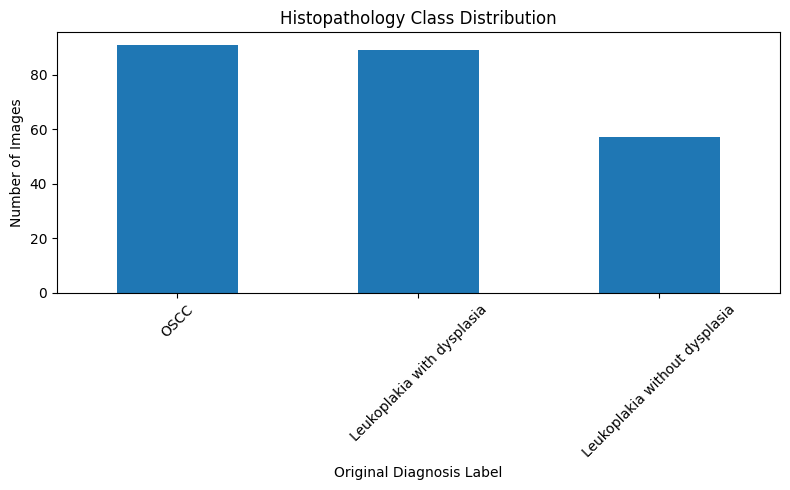


2. IMAGE PATH CHECK
Existing image paths: 237
Missing image paths: 0

3. IMAGE DIMENSIONS AND CHANNELS
Image dimension summary:


,width,height
count,237.0,237.0
mean,2048.0,1536.0
std,0.0,0.0
min,2048.0,1536.0
25%,2048.0,1536.0
50%,2048.0,1536.0
75%,2048.0,1536.0
max,2048.0,1536.0



Image modes:


,count
mode,
RGB,237



Image channel counts:


,count
channels,
3,237



Readable images: 237
Corrupted images: 0

4. DUPLICATE CHECK
Duplicate image filenames: 0
Duplicate image paths: 0
Duplicate complete records: 0

5. VERY SMALL IMAGES
Number of very small images: 0

6. RANDOM HISTOPATHOLOGY IMAGES


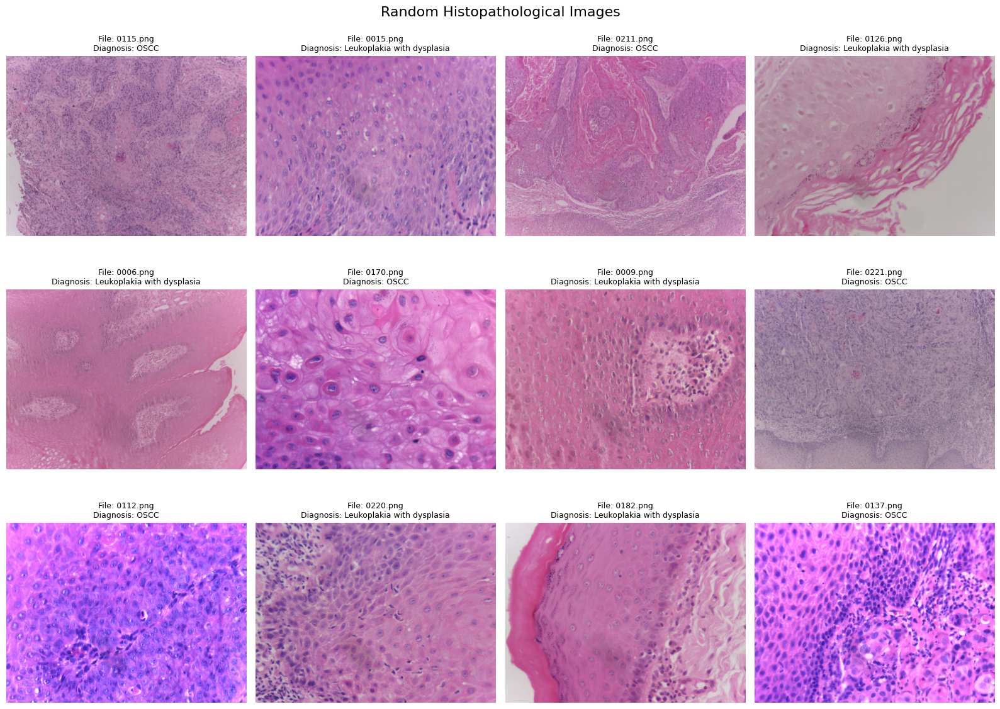


7. EXAMPLES FROM EACH DIAGNOSIS CLASS


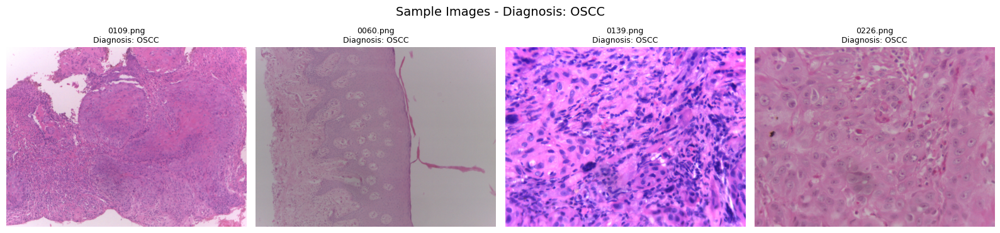

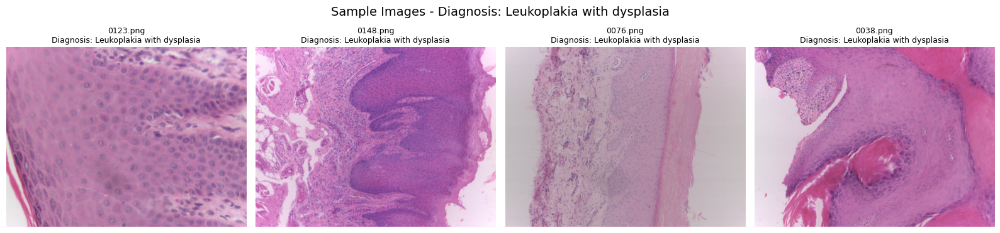

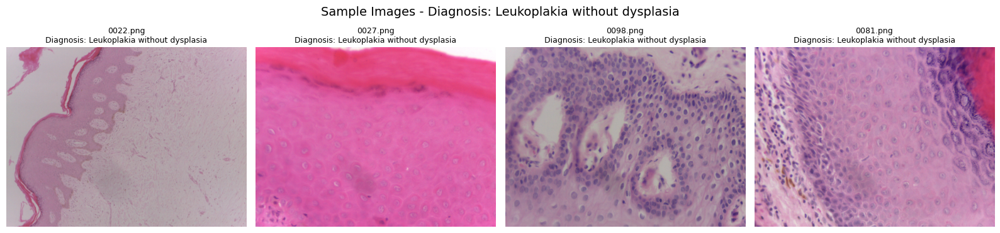


FINAL INSPECTION REPORT
Total metadata records: 237
Readable images: 237
Missing image paths: 0
Corrupted images: 0
Number of diagnosis classes: 3

Diagnosis distribution:


,sample_count,percentage
original_label,,
OSCC,91,38.40
Leukoplakia with dysplasia,89,37.55
Leukoplakia without dysplasia,57,24.05


STATUS: STOP
The dataset does not contain exactly two classes.

No model training was performed.


In [6]:
# ============================================================
# PROMPT 3: INSPECT HISTOPATHOLOGY IMAGES AND LABELS
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image, UnidentifiedImageError
from IPython.display import display

# ------------------------------------------------------------
# 1. Dataset paths
# ------------------------------------------------------------

DATASET_DIR = Path(".")
IMAGE_DIR = DATASET_DIR / "histopathological images"
METADATA_PATH = DATASET_DIR / "cleaned_histopathology_metadata.csv"

# Confirmed columns from Prompt 1 and Prompt 2
FILENAME_COLUMN = "path"
LABEL_COLUMN = "diagnosis"

# ------------------------------------------------------------
# 2. Check files
# ------------------------------------------------------------

if not IMAGE_DIR.exists():
    raise FileNotFoundError(
        f"Image folder not found: {IMAGE_DIR.resolve()}"
    )

if not METADATA_PATH.exists():
    raise FileNotFoundError(
        "cleaned_histopathology_metadata.csv not found. "
        "Run Prompt 2 first."
    )

# ------------------------------------------------------------
# 3. Load cleaned metadata
# ------------------------------------------------------------

metadata_df = pd.read_csv(METADATA_PATH)

required_columns = [
    "image_path",
    "image_filename",
    "original_label"
]

for column in required_columns:
    if column not in metadata_df.columns:
        raise ValueError(
            f"Required column '{column}' is missing from metadata."
        )

print("=" * 80)
print("HISTOPATHOLOGY DATASET INSPECTION")
print("=" * 80)

print("Filename column in original CSV:", FILENAME_COLUMN)
print("Label column in original CSV:", LABEL_COLUMN)
print("Total metadata records:", len(metadata_df))

print("\nMetadata columns:")
print(list(metadata_df.columns))

print("\nFirst 10 metadata records:")
display(metadata_df.head(10))

# ------------------------------------------------------------
# 4. Class distribution
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("1. CLASS DISTRIBUTION")
print("=" * 80)

class_counts = metadata_df["original_label"].value_counts(
    dropna=False
)

class_percentages = (
    metadata_df["original_label"]
    .value_counts(normalize=True, dropna=False)
    .mul(100)
    .round(2)
)

class_report = pd.DataFrame({
    "sample_count": class_counts,
    "percentage": class_percentages
})

display(class_report)

# Plot class distribution
plt.figure(figsize=(8, 5))

class_counts.plot(kind="bar")

plt.title("Histopathology Class Distribution")
plt.xlabel("Original Diagnosis Label")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 5. Check image paths
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("2. IMAGE PATH CHECK")
print("=" * 80)

metadata_df["path_exists"] = metadata_df["image_path"].apply(
    lambda path: Path(path).exists()
)

print(
    "Existing image paths:",
    metadata_df["path_exists"].sum()
)

print(
    "Missing image paths:",
    (~metadata_df["path_exists"]).sum()
)

missing_path_df = metadata_df[
    metadata_df["path_exists"] == False
]

if len(missing_path_df) > 0:
    print("\nSample missing paths:")
    display(missing_path_df.head(20))

# ------------------------------------------------------------
# 6. Inspect image dimensions and channels
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("3. IMAGE DIMENSIONS AND CHANNELS")
print("=" * 80)

image_information = []
corrupted_images = []

readable_metadata = metadata_df[
    metadata_df["path_exists"] == True
].copy()

for index, row in readable_metadata.iterrows():

    image_path = Path(row["image_path"])

    try:
        with Image.open(image_path) as image:

            image_information.append({
                "index": index,
                "filename": row["image_filename"],
                "label": row["original_label"],
                "width": image.width,
                "height": image.height,
                "mode": image.mode,
                "channels": len(image.getbands())
            })

    except (
        UnidentifiedImageError,
        OSError,
        ValueError
    ) as error:

        corrupted_images.append({
            "index": index,
            "filename": row["image_filename"],
            "image_path": str(image_path),
            "error": str(error)
        })

image_info_df = pd.DataFrame(image_information)

if len(image_info_df) > 0:

    print("Image dimension summary:")
    display(
        image_info_df[
            ["width", "height"]
        ].describe()
    )

    print("\nImage modes:")
    display(image_info_df["mode"].value_counts())

    print("\nImage channel counts:")
    display(image_info_df["channels"].value_counts())

else:
    print("No readable images found.")

print("\nReadable images:", len(image_info_df))
print("Corrupted images:", len(corrupted_images))

# ------------------------------------------------------------
# 7. Show corrupted images
# ------------------------------------------------------------

if len(corrupted_images) > 0:

    print("\nSample corrupted images:")
    display(pd.DataFrame(corrupted_images).head(20))

# ------------------------------------------------------------
# 8. Check duplicate records
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("4. DUPLICATE CHECK")
print("=" * 80)

print(
    "Duplicate image filenames:",
    metadata_df["image_filename"].duplicated().sum()
)

print(
    "Duplicate image paths:",
    metadata_df["image_path"].duplicated().sum()
)

print(
    "Duplicate complete records:",
    metadata_df.duplicated().sum()
)

# ------------------------------------------------------------
# 9. Check very small images
# ------------------------------------------------------------

if len(image_info_df) > 0:

    very_small_images = image_info_df[
        (image_info_df["width"] < 50)
        | (image_info_df["height"] < 50)
    ]

    print("\n" + "=" * 80)
    print("5. VERY SMALL IMAGES")
    print("=" * 80)

    print(
        "Number of very small images:",
        len(very_small_images)
    )

    if len(very_small_images) > 0:
        display(very_small_images.head(20))

# ------------------------------------------------------------
# 10. Display 12 random images
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("6. RANDOM HISTOPATHOLOGY IMAGES")
print("=" * 80)

if len(readable_metadata) == 0:

    print("No readable images are available.")

else:

    sample_count = min(12, len(readable_metadata))

    sample_df = readable_metadata.sample(
        n=sample_count,
        random_state=42
    )

    rows = 3
    columns = 4

    fig, axes = plt.subplots(
        rows,
        columns,
        figsize=(16, 12)
    )

    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, (_, row) in zip(
        axes,
        sample_df.iterrows()
    ):

        image_path = Path(row["image_path"])

        try:

            with Image.open(image_path) as image:
                ax.imshow(image.convert("RGB"))

            ax.set_title(
                f"File: {row['image_filename']}\n"
                f"Diagnosis: {row['original_label']}",
                fontsize=9
            )

            ax.axis("off")

        except Exception as error:

            ax.text(
                0.5,
                0.5,
                f"Image loading failed\n{error}",
                ha="center",
                va="center"
            )

            ax.axis("off")

    plt.suptitle(
        "Random Histopathological Images",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 11. Display examples from every class
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("7. EXAMPLES FROM EACH DIAGNOSIS CLASS")
print("=" * 80)

unique_labels = (
    metadata_df["original_label"]
    .dropna()
    .unique()
)

for label in unique_labels:

    label_df = readable_metadata[
        readable_metadata["original_label"] == label
    ]

    if len(label_df) == 0:
        continue

    sample_count = min(4, len(label_df))

    sample_df = label_df.sample(
        n=sample_count,
        random_state=42
    )

    fig, axes = plt.subplots(
        1,
        sample_count,
        figsize=(4 * sample_count, 4)
    )

    if sample_count == 1:
        axes = [axes]

    for ax, (_, row) in zip(
        axes,
        sample_df.iterrows()
    ):

        image_path = Path(row["image_path"])

        with Image.open(image_path) as image:
            ax.imshow(image.convert("RGB"))

        ax.set_title(
            f"{row['image_filename']}\n"
            f"Diagnosis: {label}",
            fontsize=9
        )

        ax.axis("off")

    plt.suptitle(
        f"Sample Images - Diagnosis: {label}",
        fontsize=14
    )

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 12. Final report
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("FINAL INSPECTION REPORT")
print("=" * 80)

print("Total metadata records:", len(metadata_df))
print("Readable images:", len(image_info_df))
print("Missing image paths:", (~metadata_df["path_exists"]).sum())
print("Corrupted images:", len(corrupted_images))
print(
    "Number of diagnosis classes:",
    metadata_df["original_label"].nunique(dropna=True)
)

print("\nDiagnosis distribution:")
display(class_report)

if (
    len(corrupted_images) > 0
    or (~metadata_df["path_exists"]).sum() > 0
):
    print("STATUS: REVIEW REQUIRED")
    print("Some images are missing or corrupted.")

elif metadata_df["original_label"].nunique(dropna=True) != 2:
    print("STATUS: STOP")
    print("The dataset does not contain exactly two classes.")

else:
    print("STATUS: IMAGE INSPECTION COMPLETED")
    print("The dataset is ready for label encoding.")

print("\nNo model training was performed.")

In [8]:
# ============================================
# PROMPT 4: ENCODE LABELS
# ============================================

import pandas as pd
from pathlib import Path

# --------------------------------------------
# 1. Load cleaned metadata
# --------------------------------------------

metadata_path = Path("cleaned_histopathology_metadata.csv")

if not metadata_path.exists():
    raise FileNotFoundError(
        f"File not found: {metadata_path}\n"
        "Please run Prompt 2 first."
    )

df = pd.read_csv(metadata_path)

print("Dataset loaded successfully!")
print(f"Total images: {len(df)}")

# --------------------------------------------
# 2. Check required columns
# --------------------------------------------

required_columns = [
    "image_path",
    "image_filename",
    "original_label"
]

missing_columns = [
    col for col in required_columns
    if col not in df.columns
]

if missing_columns:
    raise ValueError(
        f"Missing required columns: {missing_columns}"
    )

# --------------------------------------------
# 3. Remove missing labels
# --------------------------------------------

before_count = len(df)

df = df.dropna(subset=["original_label"]).copy()

df["original_label"] = (
    df["original_label"]
    .astype(str)
    .str.strip()
)

df = df[df["original_label"] != ""].copy()

after_count = len(df)

print(f"\nRows removed due to missing labels: {before_count - after_count}")

# --------------------------------------------
# 4. Remap labels for binary classification
# --------------------------------------------

# Group 'Leukoplakia with dysplasia' and 'Leukoplakia without dysplasia'
# into a single 'Leukoplakia' class.
# 'OSCC' remains as a separate class.

def remap_label(label):
    if "Leukoplakia" in label:
        return "Leukoplakia"
    return label

df["original_label_remapped"] = df["original_label"].apply(remap_label)

print("\nOriginal label distribution (before remapping):")
print(df["original_label"].value_counts())

print("\nRemapped label distribution:")
print(df["original_label_remapped"].value_counts())

# Use the remapped labels for encoding
unique_labels = sorted(df["original_label_remapped"].unique())

print("\nUnique remapped labels found:")
for index, label in enumerate(unique_labels):
    print(f"{index}: {label}")

# --------------------------------------------
# 5. Check number of classes
# --------------------------------------------

if len(unique_labels) != 2:
    raise ValueError(
        f"Expected exactly 2 classes after remapping, but found "
        f"{len(unique_labels)} classes: {unique_labels}"
    )

# --------------------------------------------
# 6. Create label encoding
# --------------------------------------------

label_mapping = {
    label: index
    for index, label in enumerate(unique_labels)
}

df["label"] = df["original_label_remapped"].map(label_mapping)

# --------------------------------------------
# 7. Display label mapping
# --------------------------------------------

print("\nLabel mapping:")
for original_label, encoded_label in label_mapping.items():
    print(f"{original_label} -> {encoded_label}")

# --------------------------------------------
# 8. Check encoded labels
# --------------------------------------------

print("\nEncoded label distribution:")
print(df["label"].value_counts().sort_index())

# --------------------------------------------
# 9. Verify image paths
# --------------------------------------------

df["image_path"] = df["image_path"].astype(str)

missing_images = df[
    ~df["image_path"].apply(lambda path: Path(path).exists())
]

print(f"\nMissing image files: {len(missing_images)}")

if len(missing_images) > 0:
    print("\nExamples of missing images:")
    print(missing_images.head())

    # Remove missing image rows
    df = df[
        df["image_path"]
        .apply(lambda path: Path(path).exists())
    ].copy()

# --------------------------------------------
# 10. Shuffle the dataset
# --------------------------------------------

df = df.sample(
    frac=1,
    random_state=42
).reset_index(drop=True)

# --------------------------------------------
# 11. Save encoded metadata
# --------------------------------------------

output_path = "histopathology_labeled_metadata.csv"

df.to_csv(
    output_path,
    index=False
)

# --------------------------------------------
# 12. Final report
# --------------------------------------------

print("\n" + "=" * 60)
print("LABEL ENCODING COMPLETED")
print("=" * 60)

print(f"Final dataset size: {len(df)}")
print(f"Number of classes: {df['label'].nunique()}")
print(f"Output file: {output_path}")

print("\nFinal columns:")
print(df.columns.tolist())

print("\nFinal class distribution:")
print(df["original_label_remapped"].value_counts())

print("\nSample records:")
display(df.head())

Dataset loaded successfully!
Total images: 237

Rows removed due to missing labels: 0

Original label distribution (before remapping):
original_label
OSCC                             91
Leukoplakia with dysplasia       89
Leukoplakia without dysplasia    57
Name: count, dtype: int64

Remapped label distribution:
original_label_remapped
Leukoplakia    146
OSCC            91
Name: count, dtype: int64

Unique remapped labels found:
0: Leukoplakia
1: OSCC

Label mapping:
Leukoplakia -> 0
OSCC -> 1

Encoded label distribution:
label
0    146
1     91
Name: count, dtype: int64

Missing image files: 0

LABEL ENCODING COMPLETED
Final dataset size: 237
Number of classes: 2
Output file: histopathology_labeled_metadata.csv

Final columns:
['image_path', 'image_filename', 'original_label', 'original_label_remapped', 'label']

Final class distribution:
original_label_remapped
Leukoplakia    146
OSCC            91
Name: count, dtype: int64

Sample records:


,image_path,image_filename,original_label,original_label_remapped,label
0,histopathological images/0115.png,0115.png,OSCC,OSCC,1
1,histopathological images/0015.png,0015.png,Leukoplakia with dysplasia,Leukoplakia,0
2,histopathological images/0211.png,0211.png,OSCC,OSCC,1
3,histopathological images/0126.png,0126.png,Leukoplakia with dysplasia,Leukoplakia,0
4,histopathological images/0006.png,0006.png,Leukoplakia with dysplasia,Leukoplakia,0


In [9]:
# ============================================
# PROMPT 5: TRAIN / VALIDATION / TEST SPLIT
# ============================================

import pandas as pd
from pathlib import Path
from sklearn.model_selection import train_test_split

# --------------------------------------------
# 1. Load labeled metadata
# --------------------------------------------

metadata_path = Path("histopathology_labeled_metadata.csv")

if not metadata_path.exists():
    raise FileNotFoundError(
        f"File not found: {metadata_path}\n"
        "Please run Prompt 4 first."
    )

df = pd.read_csv(metadata_path)

print("Labeled dataset loaded successfully!")
print(f"Total images: {len(df)}")

# --------------------------------------------
# 2. Check required columns
# --------------------------------------------

required_columns = [
    "image_path",
    "image_filename",
    "original_label",
    "label"
]

missing_columns = [
    column for column in required_columns
    if column not in df.columns
]

if missing_columns:
    raise ValueError(
        f"Missing required columns: {missing_columns}"
    )

# --------------------------------------------
# 3. Display class distribution
# --------------------------------------------

print("\nOverall class distribution:")
print(df["label"].value_counts().sort_index())

# --------------------------------------------
# 4. Split into training and temporary sets
# --------------------------------------------

# 80% training data
# 20% temporary data

train_df, temp_df = train_test_split(
    df,
    test_size=0.20,
    random_state=42,
    stratify=df["label"]
)

# --------------------------------------------
# 5. Split temporary set into validation and test
# --------------------------------------------

# Temporary set is divided equally:
# 10% validation
# 10% testing

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=42,
    stratify=temp_df["label"]
)

# --------------------------------------------
# 6. Reset indexes
# --------------------------------------------

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# --------------------------------------------
# 7. Save split datasets
# --------------------------------------------

train_df.to_csv(
    "train_metadata.csv",
    index=False
)

val_df.to_csv(
    "validation_metadata.csv",
    index=False
)

test_df.to_csv(
    "test_metadata.csv",
    index=False
)

# --------------------------------------------
# 8. Display split sizes
# --------------------------------------------

print("\n" + "=" * 60)
print("DATASET SPLIT COMPLETED")
print("=" * 60)

print(f"Training images:   {len(train_df)}")
print(f"Validation images: {len(val_df)}")
print(f"Testing images:    {len(test_df)}")

print("\nApproximate split:")
print(f"Training:   {len(train_df) / len(df) * 100:.2f}%")
print(f"Validation: {len(val_df) / len(df) * 100:.2f}%")
print(f"Testing:    {len(test_df) / len(df) * 100:.2f}%")

# --------------------------------------------
# 9. Display class distribution in each split
# --------------------------------------------

print("\nTraining class distribution:")
print(train_df["label"].value_counts().sort_index())

print("\nValidation class distribution:")
print(val_df["label"].value_counts().sort_index())

print("\nTesting class distribution:")
print(test_df["label"].value_counts().sort_index())

# --------------------------------------------
# 10. Verify there is no data leakage
# --------------------------------------------

train_files = set(train_df["image_filename"])
val_files = set(val_df["image_filename"])
test_files = set(test_df["image_filename"])

train_val_overlap = train_files.intersection(val_files)
train_test_overlap = train_files.intersection(test_files)
val_test_overlap = val_files.intersection(test_files)

print("\nData leakage check:")

print(f"Train-validation overlap: {len(train_val_overlap)}")
print(f"Train-test overlap:       {len(train_test_overlap)}")
print(f"Validation-test overlap:  {len(val_test_overlap)}")

if (
    len(train_val_overlap) == 0
    and len(train_test_overlap) == 0
    and len(val_test_overlap) == 0
):
    print("No filename overlap detected.")
else:
    print("Warning: Duplicate filenames detected between splits.")

# --------------------------------------------
# 11. Display sample records
# --------------------------------------------

print("\nTraining sample:")
display(train_df.head())

print("\nValidation sample:")
display(val_df.head())

print("\nTesting sample:")
display(test_df.head())

# --------------------------------------------
# 12. Final output files
# --------------------------------------------

print("\nGenerated files:")
print("1. train_metadata.csv")
print("2. validation_metadata.csv")
print("3. test_metadata.csv")

Labeled dataset loaded successfully!
Total images: 237

Overall class distribution:
label
0    146
1     91
Name: count, dtype: int64

DATASET SPLIT COMPLETED
Training images:   189
Validation images: 24
Testing images:    24

Approximate split:
Training:   79.75%
Validation: 10.13%
Testing:    10.13%

Training class distribution:
label
0    116
1     73
Name: count, dtype: int64

Validation class distribution:
label
0    15
1     9
Name: count, dtype: int64

Testing class distribution:
label
0    15
1     9
Name: count, dtype: int64

Data leakage check:
Train-validation overlap: 0
Train-test overlap:       0
Validation-test overlap:  0
No filename overlap detected.

Training sample:


,image_path,image_filename,original_label,original_label_remapped,label
0,histopathological images/0066.png,0066.png,OSCC,OSCC,1
1,histopathological images/0131.png,0131.png,Leukoplakia with dysplasia,Leukoplakia,0
2,histopathological images/0223.png,0223.png,OSCC,OSCC,1
3,histopathological images/0129.png,0129.png,Leukoplakia with dysplasia,Leukoplakia,0
4,histopathological images/0007.png,0007.png,Leukoplakia with dysplasia,Leukoplakia,0



Validation sample:


,image_path,image_filename,original_label,original_label_remapped,label
0,histopathological images/0138.png,0138.png,OSCC,OSCC,1
1,histopathological images/0156.png,0156.png,OSCC,OSCC,1
2,histopathological images/0181.png,0181.png,Leukoplakia with dysplasia,Leukoplakia,0
3,histopathological images/0059.png,0059.png,OSCC,OSCC,1
4,histopathological images/0084.png,0084.png,Leukoplakia without dysplasia,Leukoplakia,0



Testing sample:


,image_path,image_filename,original_label,original_label_remapped,label
0,histopathological images/0142.png,0142.png,Leukoplakia without dysplasia,Leukoplakia,0
1,histopathological images/0044.png,0044.png,Leukoplakia with dysplasia,Leukoplakia,0
2,histopathological images/0198.png,0198.png,Leukoplakia with dysplasia,Leukoplakia,0
3,histopathological images/0134.png,0134.png,OSCC,OSCC,1
4,histopathological images/0037.png,0037.png,Leukoplakia with dysplasia,Leukoplakia,0



Generated files:
1. train_metadata.csv
2. validation_metadata.csv
3. test_metadata.csv


Metadata files loaded successfully!
Training images:   189
Validation images: 24
Testing images:    24

Generators created successfully!
Training batches:   6
Validation batches: 1
Testing batches:    1

Sample batch information:
Image batch shape: (32, 224, 224, 3)
Label batch shape: (32,)
Image data type:   float32
Label data type:   float32
Pixel value range: 0.0314 to 1.0000


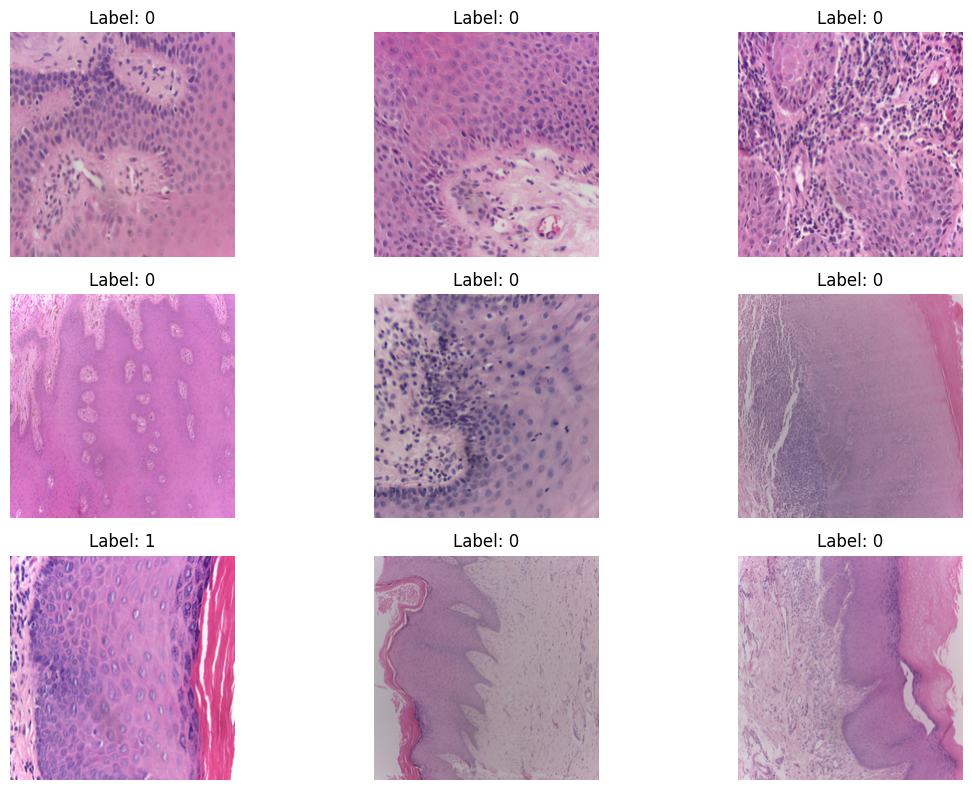


IMAGE PREPROCESSING COMPLETED SUCCESSFULLY
Image size: 224 x 224
Channels: RGB
Normalization: 0 to 1
Batch size: 32


In [10]:
# ============================================
# PROMPT 6: IMAGE PREPROCESSING
# ============================================

import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image
from tensorflow.keras.utils import Sequence

# --------------------------------------------
# 1. Configuration
# --------------------------------------------

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32
NUM_CHANNELS = 3

# --------------------------------------------
# 2. Load metadata files
# --------------------------------------------

train_df = pd.read_csv("train_metadata.csv")
val_df = pd.read_csv("validation_metadata.csv")
test_df = pd.read_csv("test_metadata.csv")

print("Metadata files loaded successfully!")

print(f"Training images:   {len(train_df)}")
print(f"Validation images: {len(val_df)}")
print(f"Testing images:    {len(test_df)}")

# --------------------------------------------
# 3. Image preprocessing function
# --------------------------------------------

def load_and_preprocess_image(image_path):
    """
    Loads an image, converts it to RGB,
    resizes it to 224x224, and normalizes
    pixel values between 0 and 1.
    """

    image = Image.open(image_path).convert("RGB")

    image = image.resize(
        IMAGE_SIZE,
        Image.Resampling.LANCZOS
    )

    image = np.array(image, dtype=np.float32)

    # Normalize pixel values from [0, 255] to [0, 1]
    image = image / 255.0

    return image


# --------------------------------------------
# 4. Create TensorFlow data generator
# --------------------------------------------

class HistopathologyDataGenerator(Sequence):

    def __init__(
        self,
        dataframe,
        batch_size=BATCH_SIZE,
        image_size=IMAGE_SIZE,
        shuffle=False
    ):
        self.dataframe = dataframe.reset_index(drop=True)
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle

        self.indexes = np.arange(len(self.dataframe))

        self.on_epoch_end()

    def __len__(self):
        """
        Number of batches per epoch.
        """
        return int(
            np.ceil(len(self.dataframe) / self.batch_size)
        )

    def __getitem__(self, index):
        """
        Generate one batch of data.
        """

        batch_indexes = self.indexes[
            index * self.batch_size:
            (index + 1) * self.batch_size
        ]

        batch_df = self.dataframe.iloc[batch_indexes]

        images = []
        labels = []

        for _, row in batch_df.iterrows():

            image_path = row["image_path"]
            label = row["label"]

            try:
                image = load_and_preprocess_image(
                    image_path
                )

                images.append(image)
                labels.append(label)

            except Exception as error:
                print(
                    f"Error loading image: {image_path}"
                )
                print(error)

        return (
            np.array(images, dtype=np.float32),
            np.array(labels, dtype=np.float32)
        )

    def on_epoch_end(self):
        """
        Shuffle indexes after every epoch.
        """

        if self.shuffle:
            np.random.shuffle(self.indexes)


# --------------------------------------------
# 5. Create generators
# --------------------------------------------

train_generator = HistopathologyDataGenerator(
    dataframe=train_df,
    batch_size=BATCH_SIZE,
    shuffle=True
)

validation_generator = HistopathologyDataGenerator(
    dataframe=val_df,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_generator = HistopathologyDataGenerator(
    dataframe=test_df,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print("\nGenerators created successfully!")

print(f"Training batches:   {len(train_generator)}")
print(f"Validation batches: {len(validation_generator)}")
print(f"Testing batches:    {len(test_generator)}")

# --------------------------------------------
# 6. Test one batch
# --------------------------------------------

sample_images, sample_labels = train_generator[0]

print("\nSample batch information:")
print(f"Image batch shape: {sample_images.shape}")
print(f"Label batch shape: {sample_labels.shape}")
print(f"Image data type:   {sample_images.dtype}")
print(f"Label data type:   {sample_labels.dtype}")

print(
    f"Pixel value range: "
    f"{sample_images.min():.4f} to "
    f"{sample_images.max():.4f}"
)

# --------------------------------------------
# 7. Display sample images
# --------------------------------------------

plt.figure(figsize=(12, 8))

number_of_images = min(9, len(sample_images))

for i in range(number_of_images):

    plt.subplot(3, 3, i + 1)

    plt.imshow(sample_images[i])

    plt.title(
        f"Label: {int(sample_labels[i])}"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

# --------------------------------------------
# 8. Final verification
# --------------------------------------------

assert sample_images.ndim == 4
assert sample_images.shape[1:] == (
    IMAGE_SIZE[0],
    IMAGE_SIZE[1],
    NUM_CHANNELS
)

assert sample_images.min() >= 0.0
assert sample_images.max() <= 1.0

print("\n" + "=" * 60)
print("IMAGE PREPROCESSING COMPLETED SUCCESSFULLY")
print("=" * 60)
print("Image size: 224 x 224")
print("Channels: RGB")
print("Normalization: 0 to 1")
print("Batch size:", BATCH_SIZE)

In [24]:
import tensorflow as tf

from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import EfficientNetB0

# --------------------------------------------
# 1. Configuration
# --------------------------------------------

IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
CHANNELS = 3
NUM_CLASSES = 1

# --------------------------------------------
# 2. Data augmentation
# --------------------------------------------

data_augmentation = models.Sequential(
    [
        layers.RandomFlip(
            mode="horizontal_and_vertical"
        ),

        layers.RandomRotation(
            factor=0.2
        ),

        # FIXED: Removed the positional 0.2 to avoid multiple values for height_factor
        layers.RandomZoom(
            height_factor=0.2,
            width_factor=0.2
        ),

        layers.RandomContrast(
            factor=0.1
        )
    ],
    name="data_augmentation"
)

# --------------------------------------------
# 3. Load EfficientNetB0
# --------------------------------------------

base_model = EfficientNetB0(
    weights="imagenet",
    include_top=False,
    input_shape=(
        IMAGE_HEIGHT,
        IMAGE_WIDTH,
        CHANNELS
    )
)

# Freeze pretrained layers
base_model.trainable = False

# --------------------------------------------
# 4. Build transfer-learning model
# --------------------------------------------

cnn_model = models.Sequential(
    [
        layers.Input(
            shape=(
                IMAGE_HEIGHT,
                IMAGE_WIDTH,
                CHANNELS
            )
        ),

        data_augmentation,

        base_model,

        layers.GlobalAveragePooling2D(),

        layers.Dense(
            units=128,
            activation="relu"
        ),

        layers.Dropout(
            rate=0.5
        ),

        layers.Dense(
            units=NUM_CLASSES,
            activation="sigmoid"
        )
    ],
    name="EfficientNetB0_Histopathology_CNN"
)

# --------------------------------------------
# 5. Compile model
# --------------------------------------------

cnn_model.compile(
    optimizer=Adam(
        learning_rate=0.0001
    ),

    loss="binary_crossentropy",

    metrics=[
        "accuracy",

        tf.keras.metrics.Precision(
            name="precision"
        ),

        tf.keras.metrics.Recall(
            name="recall"
        ),

        tf.keras.metrics.AUC(
            name="auc"
        )
    ]
)

# --------------------------------------------
# 6. Display model summary
# --------------------------------------------

print("=" * 70)
print("EFFICIENTNETB0 CNN MODEL SUMMARY")
print("=" * 70)

cnn_model.summary()

# --------------------------------------------
# 7. Display configuration
# --------------------------------------------

print("\n" + "=" * 70)
print("MODEL CONFIGURATION")
print("=" * 70)

print("Input image size: 224 x 224 x 3")
print("Data augmentation: RandomFlip, RandomRotation, RandomZoom, RandomContrast")
print("Base model: EfficientNetB0")
print("Pretrained weights: ImageNet")
print("Base model frozen: True")
print("Optimizer: Adam")
print("Learning rate: 0.0001")
print("Loss function: Binary Crossentropy")
print("Output activation: Sigmoid")
print("Task: Binary classification")

# --------------------------------------------
# 8. Verify model output
# --------------------------------------------

dummy_input = tf.random.normal(
    shape=(
        1,
        IMAGE_HEIGHT,
        IMAGE_WIDTH,
        CHANNELS
    )
)

dummy_output = cnn_model(
    dummy_input,
    training=False
)

print("\nDummy input shape:", dummy_input.shape)
print("Dummy output shape:", dummy_output.shape)
print("Dummy prediction:", dummy_output.numpy())

assert dummy_output.shape == (
    1,
    NUM_CLASSES
)

print("\nCNN model created successfully!")

EFFICIENTNETB0 CNN MODEL SUMMARY


Model: "EfficientNetB0_Histopathology_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,213,668 (16.07 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 4,049,571 (15.45 MB)


MODEL CONFIGURATION
Input image size: 224 x 224 x 3
Data augmentation: RandomFlip, RandomRotation, RandomZoom, RandomContrast
Base model: EfficientNetB0
Pretrained weights: ImageNet
Base model frozen: True
Optimizer: Adam
Learning rate: 0.0001
Loss function: Binary Crossentropy
Output activation: Sigmoid
Task: Binary classification

Dummy input shape: (1, 224, 224, 3)
Dummy output shape: (1, 1)
Dummy prediction: [[0.50767803]]

CNN model created successfully!


In [ ]:
# ============================================
# PROMPT 8: TRAIN CNN MODEL (IMPROVED)
# ============================================

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

# 1. Training configuration
EPOCHS = 50
INITIAL_EPOCHS = 15
MODEL_PATH = "best_efficientnet_histopathology.keras"

# 2. Calculate class weights
train_df = pd.read_csv("train_metadata.csv")
total_samples = len(train_df)
unique_classes, class_counts = np.unique(train_df['label'], return_counts=True)
class_weights = {i: total_samples / (len(unique_classes) * count) for i, count in zip(unique_classes, class_counts)}
print("\nCalculated Class Weights:", class_weights)

# 3. Callbacks
callbacks = [
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1),
    ModelCheckpoint(filepath=MODEL_PATH, monitor="val_loss", save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-7, verbose=1)
]

# 4. Phase 1: Feature Extraction
print("\nStarting Phase 1: Feature Extraction...")
history_phase1 = cnn_model.fit(
    train_generator,
    epochs=INITIAL_EPOCHS,
    validation_data=validation_generator,
    callbacks=callbacks,
    class_weight=class_weights
)

# 5. Phase 2: Fine-tuning
print("\nStarting Phase 2: Fine-tuning...")
base_model = cnn_model.get_layer('efficientnetb0')
base_model.trainable = True

cnn_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss="binary_crossentropy",
    metrics=["accuracy", tf.keras.metrics.Precision(name="precision"), tf.keras.metrics.Recall(name="recall"), tf.keras.metrics.AUC(name="auc")]
)

history_phase2 = cnn_model.fit(
    train_generator,
    epochs=EPOCHS,
    initial_epoch=len(history_phase1.epoch),
    validation_data=validation_generator,
    callbacks=callbacks,
    class_weight=class_weights
)

print("\nTraining complete. Best model saved at:", MODEL_PATH)


Calculated Class Weights: {np.int64(0): np.float64(0.8146551724137931), np.int64(1): np.float64(1.2945205479452055)}

Starting Phase 1: Feature Extraction...
Epoch 1/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.5145 - auc: 0.5061 - loss: 0.7149 - precision: 0.4110 - recall: 0.6447
Epoch 1: val_loss improved from None to 0.68313, saving model to best_efficientnet_histopathology.keras

Epoch 1: finished saving model to best_efficientnet_histopathology.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 74s 9s/step - accuracy: 0.4974 - auc: 0.5024 - loss: 0.7110 - precision: 0.4000 - recall: 0.6027 - val_accuracy: 0.6250 - val_auc: 0.5000 - val_loss: 0.6831 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/15
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.5008 - auc: 0.4793 - loss: 0.7206 - precision: 0.3815 - recall: 0.3650
Epoch 2: val_loss did not improve from 0.68313
6/6 ━━━━━━━━━━━━━━━━━━━━ 49s 8s/step - accuracy: 0.5132 - auc: 0.4835 - loss: 0.7108 - pr

Best CNN model loaded successfully!

Generating predictions on test data...
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step

Prediction verification:
True labels: 24
Predictions: 24

TEST DATASET EVALUATION
Accuracy:  0.6250
Precision: 0.0000
Recall:    0.0000
F1-score:  0.0000
ROC-AUC:   0.2296

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.62      1.00      0.77        15
     Class 1       0.00      0.00      0.00         9

    accuracy                           0.62        24
   macro avg       0.31      0.50      0.38        24
weighted avg       0.39      0.62      0.48        24


Confusion Matrix:
[[15  0]
 [ 9  0]]


<Figure size 700x600 with 0 Axes>

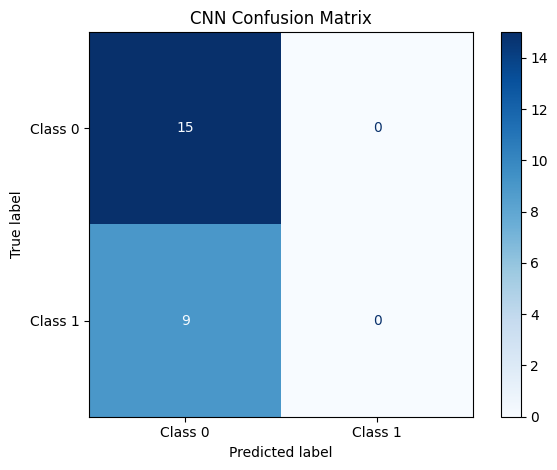

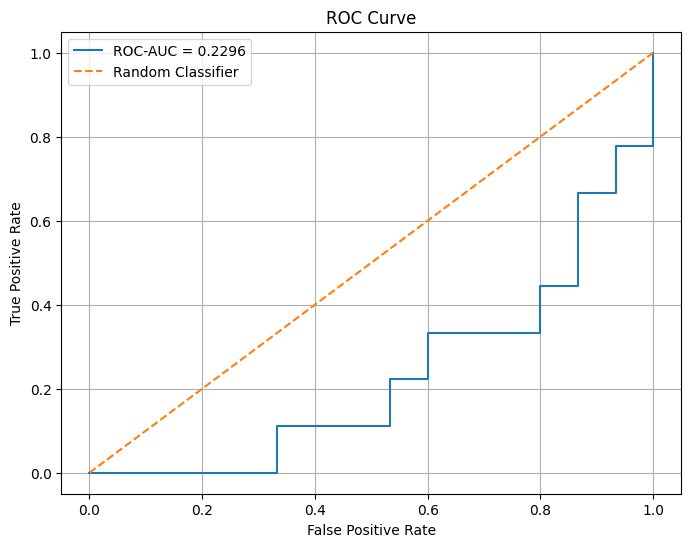


MODEL EVALUATION COMPLETED
Generated files:
1. cnn_evaluation_results.csv
2. cnn_test_predictions.csv
3. Confusion matrix plot
4. ROC curve plot


In [23]:
# ============================================
# PROMPT 9: EVALUATE CNN MODEL
# ============================================

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from pathlib import Path
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
    ConfusionMatrixDisplay,
    roc_curve
)

# --------------------------------------------
# 1. Load the best saved model
# --------------------------------------------

MODEL_PATH = "best_histopathology_cnn.keras"

if not Path(MODEL_PATH).exists():
    raise FileNotFoundError(
        f"Model not found: {MODEL_PATH}\n"
        "Please run Prompt 8 first."
    )

best_model = tf.keras.models.load_model(
    MODEL_PATH
)

print("Best CNN model loaded successfully!")

# --------------------------------------------
# 2. Generate predictions
# --------------------------------------------

print("\nGenerating predictions on test data...")

test_probabilities = best_model.predict(
    test_generator,
    verbose=1
).ravel()

# Convert probabilities into binary predictions
test_predictions = (
    test_probabilities >= 0.5
).astype(int)

# Get true labels
test_true_labels = test_df["label"].astype(int).to_numpy()

# --------------------------------------------
# 3. Verify prediction count
# --------------------------------------------

print("\nPrediction verification:")
print("True labels:", len(test_true_labels))
print("Predictions:", len(test_predictions))

if len(test_true_labels) != len(test_predictions):
    raise ValueError(
        "The number of predictions does not match "
        "the number of test labels."
    )

# --------------------------------------------
# 4. Calculate evaluation metrics
# --------------------------------------------

accuracy = accuracy_score(
    test_true_labels,
    test_predictions
)

precision = precision_score(
    test_true_labels,
    test_predictions,
    zero_division=0
)

recall = recall_score(
    test_true_labels,
    test_predictions,
    zero_division=0
)

f1 = f1_score(
    test_true_labels,
    test_predictions,
    zero_division=0
)

try:
    auc = roc_auc_score(
        test_true_labels,
        test_probabilities
    )
except ValueError:
    auc = float("nan")

# --------------------------------------------
# 5. Display evaluation metrics
# --------------------------------------------

print("\n" + "=" * 70)
print("TEST DATASET EVALUATION")
print("=" * 70)

print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")
print(f"ROC-AUC:   {auc:.4f}")

# --------------------------------------------
# 6. Classification report
# --------------------------------------------

print("\nClassification Report:")

print(
    classification_report(
        test_true_labels,
        test_predictions,
        target_names=["Class 0", "Class 1"],
        zero_division=0
    )
)

# --------------------------------------------
# 7. Confusion matrix
# --------------------------------------------

cm = confusion_matrix(
    test_true_labels,
    test_predictions
)

print("\nConfusion Matrix:")
print(cm)

plt.figure(figsize=(7, 6))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=["Class 0", "Class 1"]
)

disp.plot(
    cmap="Blues",
    values_format="d"
)

plt.title("CNN Confusion Matrix")
plt.tight_layout()
plt.show()

# --------------------------------------------
# 8. Plot ROC curve
# --------------------------------------------

if len(np.unique(test_true_labels)) == 2:

    false_positive_rate, true_positive_rate, thresholds = roc_curve(
        test_true_labels,
        test_probabilities
    )

    plt.figure(figsize=(8, 6))

    plt.plot(
        false_positive_rate,
        true_positive_rate,
        label=f"ROC-AUC = {auc:.4f}"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        label="Random Classifier"
    )

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()
    plt.grid(True)
    plt.show()

# --------------------------------------------
# 9. Save evaluation results
# --------------------------------------------

evaluation_results = pd.DataFrame(
    {
        "Metric": [
            "Accuracy",
            "Precision",
            "Recall",
            "F1-score",
            "ROC-AUC"
        ],
        "Value": [
            accuracy,
            precision,
            recall,
            f1,
            auc
        ]
    }
)

evaluation_results.to_csv(
    "cnn_evaluation_results.csv",
    index=False
)

# --------------------------------------------
# 10. Save predictions
# --------------------------------------------

prediction_results = test_df.copy()

prediction_results["predicted_probability"] = (
    test_probabilities
)

prediction_results["predicted_label"] = (
    test_predictions
)

prediction_results["prediction_correct"] = (
    prediction_results["label"]
    == prediction_results["predicted_label"]
)

prediction_results.to_csv(
    "cnn_test_predictions.csv",
    index=False
)

# --------------------------------------------
# 11. Final report
# --------------------------------------------

print("\n" + "=" * 70)
print("MODEL EVALUATION COMPLETED")
print("=" * 70)

print("Generated files:")
print("1. cnn_evaluation_results.csv")
print("2. cnn_test_predictions.csv")
print("3. Confusion matrix plot")
print("4. ROC curve plot")

Prediction results loaded successfully!
Total test images: 24

Prediction statistics:
Correct predictions:   9
Incorrect predictions: 15


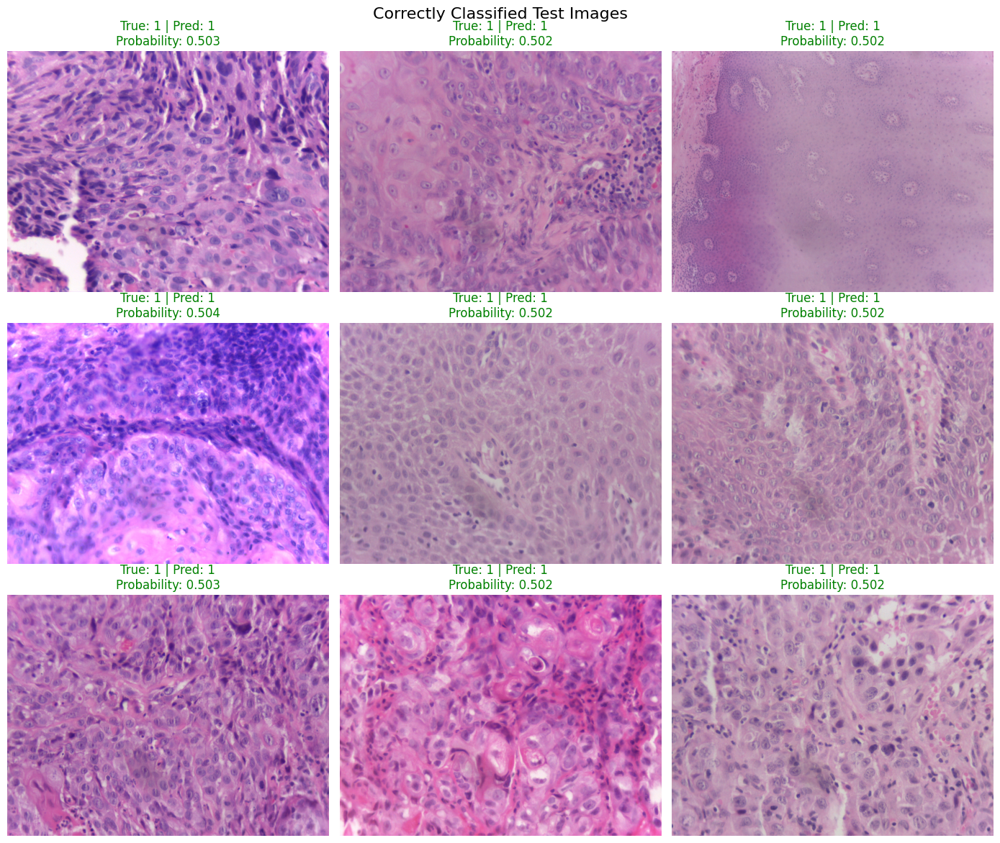

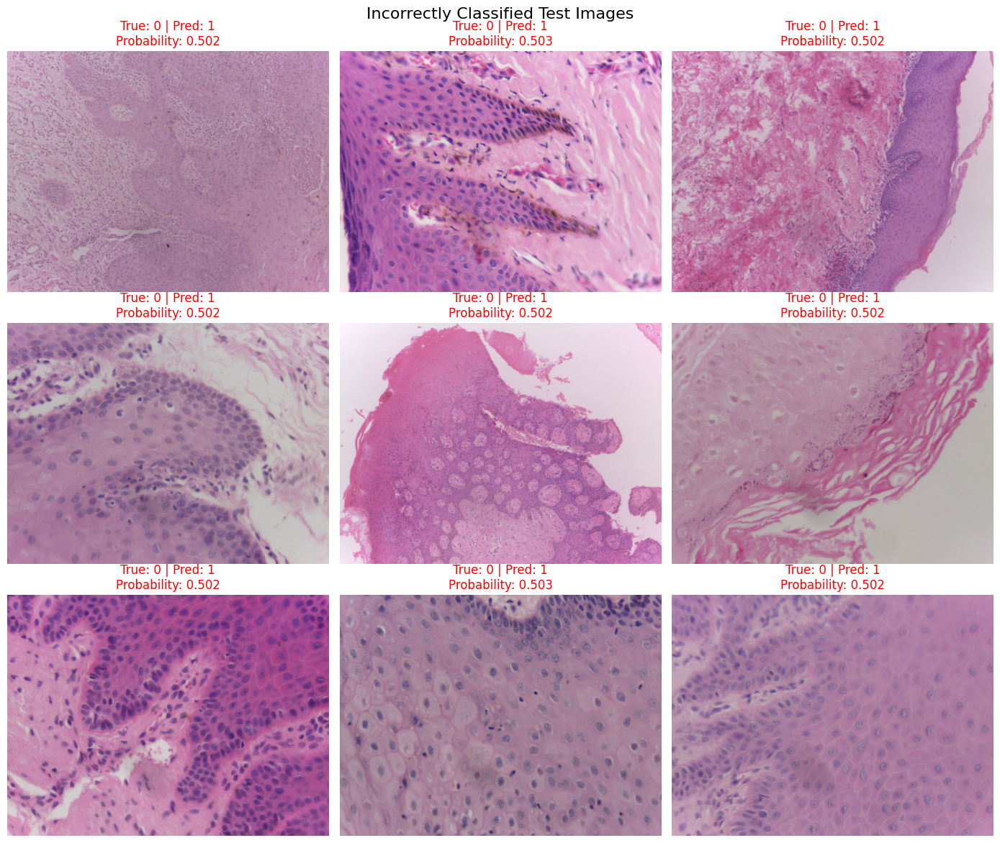

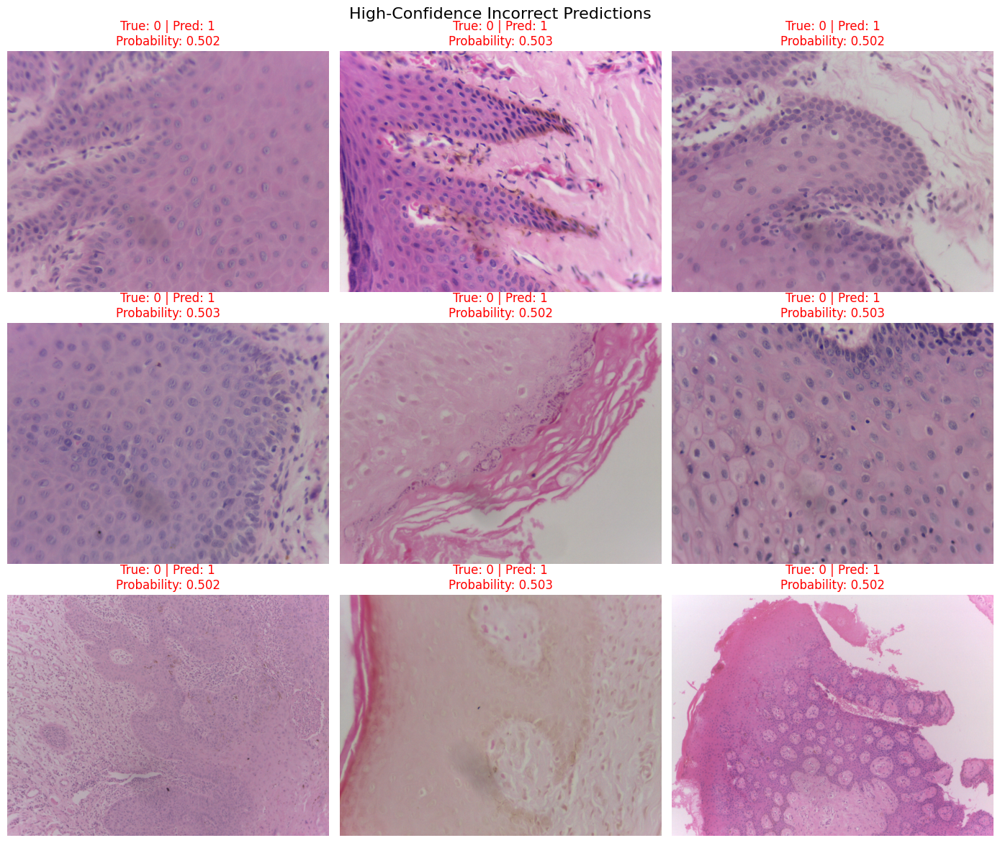


PREDICTION VISUALIZATION COMPLETED
Generated files:
1. incorrect_cnn_predictions.csv
2. high_confidence_cnn_errors.csv


In [20]:
# ============================================
# PROMPT 11: VISUALIZE MODEL PREDICTIONS
# ============================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from pathlib import Path

# --------------------------------------------
# 1. Load prediction results
# --------------------------------------------

prediction_path = Path("cnn_test_predictions.csv")

if not prediction_path.exists():
    raise FileNotFoundError(
        "cnn_test_predictions.csv not found. "
        "Please run Prompt 9 first."
    )

predictions_df = pd.read_csv(
    prediction_path
)

print("Prediction results loaded successfully!")
print(f"Total test images: {len(predictions_df)}")

# --------------------------------------------
# 2. Display prediction statistics
# --------------------------------------------

correct_predictions = predictions_df[
    predictions_df["prediction_correct"] == True
]

incorrect_predictions = predictions_df[
    predictions_df["prediction_correct"] == False
]

print("\nPrediction statistics:")
print(f"Correct predictions:   {len(correct_predictions)}")
print(f"Incorrect predictions: {len(incorrect_predictions)}")

# --------------------------------------------
# 3. Helper function to display images
# --------------------------------------------

def display_prediction_images(
    dataframe,
    title,
    number_of_images=9
):
    """
    Display images with true and predicted labels.
    """

    if len(dataframe) == 0:
        print(f"No images available for: {title}")
        return

    sample_df = dataframe.sample(
        n=min(number_of_images, len(dataframe)),
        random_state=42
    )

    rows = 3
    columns = 3

    plt.figure(figsize=(14, 12))

    for index, (_, row) in enumerate(sample_df.iterrows()):

        image_path = row["image_path"]

        try:
            image = Image.open(image_path).convert("RGB")

            plt.subplot(rows, columns, index + 1)

            plt.imshow(image)

            true_label = int(row["label"])
            predicted_label = int(
                row["predicted_label"]
            )

            probability = float(
                row["predicted_probability"]
            )

            if true_label == predicted_label:
                title_color = "green"
            else:
                title_color = "red"

            plt.title(
                f"True: {true_label} | "
                f"Pred: {predicted_label}\n"
                f"Probability: {probability:.3f}",
                color=title_color
            )

            plt.axis("off")

        except Exception as error:
            print(
                f"Could not display image: {image_path}"
            )
            print(error)

    plt.suptitle(
        title,
        fontsize=16
    )

    plt.tight_layout()
    plt.show()


# --------------------------------------------
# 4. Display correctly classified images
# --------------------------------------------

display_prediction_images(
    dataframe=correct_predictions,
    title="Correctly Classified Test Images",
    number_of_images=9
)

# --------------------------------------------
# 5. Display incorrectly classified images
# --------------------------------------------

display_prediction_images(
    dataframe=incorrect_predictions,
    title="Incorrectly Classified Test Images",
    number_of_images=9
)

# --------------------------------------------
# 6. Display high-confidence wrong predictions
# --------------------------------------------

incorrect_predictions = incorrect_predictions.copy()

incorrect_predictions["confidence"] = (
    np.maximum(
        incorrect_predictions["predicted_probability"],
        1 - incorrect_predictions["predicted_probability"]
    )
)

high_confidence_errors = (
    incorrect_predictions
    .sort_values(
        by="confidence",
        ascending=False
    )
    .head(9)
)

display_prediction_images(
    dataframe=high_confidence_errors,
    title="High-Confidence Incorrect Predictions",
    number_of_images=9
)

# --------------------------------------------
# 7. Save incorrect predictions
# --------------------------------------------

incorrect_predictions.to_csv(
    "incorrect_cnn_predictions.csv",
    index=False
)

high_confidence_errors.to_csv(
    "high_confidence_cnn_errors.csv",
    index=False
)

# --------------------------------------------
# 8. Final report
# --------------------------------------------

print("\n" + "=" * 70)
print("PREDICTION VISUALIZATION COMPLETED")
print("=" * 70)

print("Generated files:")
print("1. incorrect_cnn_predictions.csv")
print("2. high_confidence_cnn_errors.csv")

In [ ]:
# ============================================
# STEP 15: EVALUATE TEST DATASET
# ============================================

import torch
import numpy as np

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    classification_report
)

# --------------------------------------------
# 1. Load the best saved model
# --------------------------------------------

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = model.to(device)

checkpoint_path = "best_histopathology_model.pth"

checkpoint = torch.load(
    checkpoint_path,
    map_location=device
)

# Supports both state_dict-only and checkpoint dictionaries
if isinstance(checkpoint, dict) and "model_state_dict" in checkpoint:
    model.load_state_dict(checkpoint["model_state_dict"])
else:
    model.load_state_dict(checkpoint)

model.eval()

print("Best model loaded successfully.")


# --------------------------------------------
# 2. Generate predictions
# --------------------------------------------

all_labels = []
all_predictions = []
all_probabilities = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        # For binary classification with one output neuron
        if outputs.ndim == 1 or outputs.shape[1] == 1:

            probabilities = torch.sigmoid(
                outputs.view(-1)
            )

            predictions = (
                probabilities >= 0.5
            ).long()

        # For classification with two output neurons
        else:

            probabilities = torch.softmax(
                outputs,
                dim=1
            )[:, 1]

            predictions = torch.argmax(
                outputs,
                dim=1
            )

        all_labels.extend(
            labels.cpu().numpy()
        )

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_probabilities.extend(
            probabilities.cpu().numpy()
        )


# Convert to NumPy arrays
all_labels = np.array(all_labels)
all_predictions = np.array(all_predictions)
all_probabilities = np.array(all_probabilities)


# --------------------------------------------
# 3. Calculate metrics
# --------------------------------------------

accuracy = accuracy_score(
    all_labels,
    all_predictions
)

precision = precision_score(
    all_labels,
    all_predictions,
    zero_division=0
)

recall = recall_score(
    all_labels,
    all_predictions,
    zero_division=0
)

f1 = f1_score(
    all_labels,
    all_predictions,
    zero_division=0
)

roc_auc = roc_auc_score(
    all_labels,
    all_probabilities
)


# --------------------------------------------
# 4. Print results
# --------------------------------------------

print("\n========== TEST DATASET RESULTS ==========")

print(f"Number of test images: {len(all_labels)}")
print(f"Accuracy              : {accuracy:.4f}")
print(f"Precision             : {precision:.4f}")
print(f"Recall                : {recall:.4f}")
print(f"F1-score              : {f1:.4f}")
print(f"ROC-AUC               : {roc_auc:.4f}")


# --------------------------------------------
# 5. Classification report
# --------------------------------------------

print("\n========== CLASSIFICATION REPORT ==========")

print(
    classification_report(
        all_labels,
        all_predictions,
        labels=[0, 1],
        target_names=[
            "Non-Cancer",
            "Cancer"
        ],
        zero_division=0
    )
)

In [ ]:
# ============================================
# STEP 16: CONFUSION MATRIX HEATMAP
# ============================================

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix


# --------------------------------------------
# 1. Create confusion matrix
# --------------------------------------------

cm = confusion_matrix(
    all_labels,
    all_predictions,
    labels=[0, 1]
)

tn, fp, fn, tp = cm.ravel()


# --------------------------------------------
# 2. Print TN, FP, FN and TP
# --------------------------------------------

print("\n========== CONFUSION MATRIX VALUES ==========")

print(f"True Negative  (TN): {tn}")
print(f"False Positive (FP): {fp}")
print(f"False Negative (FN): {fn}")
print(f"True Positive  (TP): {tp}")


# --------------------------------------------
# 3. Plot heatmap
# --------------------------------------------

plt.figure(figsize=(8, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    cbar=True,
    square=True,
    linewidths=1,
    xticklabels=[
        "Non-Cancer",
        "Cancer"
    ],
    yticklabels=[
        "Non-Cancer",
        "Cancer"
    ],
    annot_kws={
        "size": 16,
        "weight": "bold"
    }
)

plt.title(
    "Histopathology Confusion Matrix",
    fontsize=16,
    fontweight="bold"
)

plt.xlabel(
    "Predicted Label",
    fontsize=13
)

plt.ylabel(
    "True Label",
    fontsize=13
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================
# STEP 17: ROC CURVE
# ============================================

import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_curve,
    roc_auc_score
)


# --------------------------------------------
# 1. Calculate ROC values
# --------------------------------------------

false_positive_rate, true_positive_rate, thresholds = roc_curve(
    all_labels,
    all_probabilities
)

roc_auc = roc_auc_score(
    all_labels,
    all_probabilities
)


# --------------------------------------------
# 2. Plot ROC curve
# --------------------------------------------

plt.figure(figsize=(8, 6))

plt.plot(
    false_positive_rate,
    true_positive_rate,
    linewidth=2,
    label=f"ResNet18 ROC-AUC = {roc_auc:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=2,
    label="Random Classifier"
)

plt.xlabel(
    "False Positive Rate",
    fontsize=13
)

plt.ylabel(
    "True Positive Rate",
    fontsize=13
)

plt.title(
    "ROC Curve - Histopathology Classifier",
    fontsize=16,
    fontweight="bold"
)

plt.legend(
    loc="lower right",
    fontsize=11
)

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# ============================================
# STEP 18: GRAD-CAM VISUALIZATION
# ============================================

import cv2
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn.functional as F


class GradCAM:

    def __init__(self, model, target_layer):

        self.model = model
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        self.forward_hook = target_layer.register_forward_hook(
            self.save_activation
        )

        self.backward_hook = target_layer.register_full_backward_hook(
            self.save_gradient
        )

    def save_activation(self, module, input, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate(self, image_tensor):

        self.model.eval()

        image_tensor = image_tensor.to(device)

        self.model.zero_grad()

        output = self.model(image_tensor)

        # Binary classification
        if output.ndim == 1 or output.shape[1] == 1:

            score = output.view(-1)[0]

            probability = torch.sigmoid(
                output.view(-1)
            )[0]

            predicted_class = int(
                probability >= 0.5
            )

        # Two-class classification
        else:

            predicted_class = torch.argmax(
                output,
                dim=1
            )[0].item()

            score = output[0, predicted_class]

            probability = torch.softmax(
                output,
                dim=1
            )[0, predicted_class]

        score.backward()

        activations = self.activations.detach()
        gradients = self.gradients.detach()

        # Global average pooling of gradients
        weights = gradients.mean(
            dim=(2, 3),
            keepdim=True
        )

        # Weighted feature maps
        cam = (
            weights * activations
        ).sum(dim=1).squeeze()

        cam = F.relu(cam)

        # Normalize CAM
        cam = cam.cpu().numpy()

        cam = cam - cam.min()

        if cam.max() != 0:
            cam = cam / cam.max()

        return (
            cam,
            predicted_class,
            float(probability.detach().cpu().item())
        )

    def remove_hooks(self):

        self.forward_hook.remove()
        self.backward_hook.remove()

In [ ]:
 # --------------------------------------------
# Select final convolutional layer
# --------------------------------------------

target_layer = model.layer4[-1].conv2

gradcam = GradCAM(
    model=model,
    target_layer=target_layer
)

print("Grad-CAM target layer:")
print(target_layer)

In [ ]:
# --------------------------------------------
# Grad-CAM visualization function
# --------------------------------------------

def show_gradcam(
    image_tensor,
    true_label,
    image_index,
    gradcam
):

    # Generate Grad-CAM
    cam, predicted_class, confidence = gradcam.generate(
        image_tensor.unsqueeze(0)
    )

    # ----------------------------------------
    # Convert tensor to displayable image
    # ----------------------------------------

    image = image_tensor.detach().cpu().numpy()
    image = np.transpose(image, (1, 2, 0))

    # ImageNet denormalization
    mean = np.array([
        0.485,
        0.456,
        0.406
    ])

    std = np.array([
        0.229,
        0.224,
        0.225
    ])

    image = image * std + mean
    image = np.clip(image, 0, 1)

    # Convert to uint8
    image_uint8 = np.uint8(
        image * 255
    )

    height, width, _ = image_uint8.shape

    # ----------------------------------------
    # Resize CAM
    # ----------------------------------------

    cam_resized = cv2.resize(
        cam,
        (width, height)
    )

    heatmap = np.uint8(
        255 * cam_resized
    )

    heatmap = cv2.applyColorMap(
        heatmap,
        cv2.COLORMAP_JET
    )

    heatmap = cv2.cvtColor(
        heatmap,
        cv2.COLOR_BGR2RGB
    )

    # ----------------------------------------
    # Overlay heatmap
    # ----------------------------------------

    overlay = cv2.addWeighted(
        image_uint8,
        0.6,
        heatmap,
        0.4,
        0
    )

    true_name = (
        "Cancer"
        if int(true_label) == 1
        else "Non-Cancer"
    )

    predicted_name = (
        "Cancer"
        if int(predicted_class) == 1
        else "Non-Cancer"
    )

    # ----------------------------------------
    # Display results
    # ----------------------------------------

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(15, 5)
    )

    axes[0].imshow(image)
    axes[0].set_title(
        "Original Image",
        fontsize=13,
        fontweight="bold"
    )
    axes[0].axis("off")

    axes[1].imshow(heatmap)
    axes[1].set_title(
        "Grad-CAM Heatmap",
        fontsize=13,
        fontweight="bold"
    )
    axes[1].axis("off")

    axes[2].imshow(overlay)
    axes[2].set_title(
        "Heatmap Overlay",
        fontsize=13,
        fontweight="bold"
    )
    axes[2].axis("off")

    plt.suptitle(
        f"Image Index: {image_index}\n"
        f"True Label: {true_name} | "
        f"Predicted: {predicted_name} | "
        f"Confidence: {confidence:.2%}",
        fontsize=14,
        fontweight="bold"
    )

    plt.tight_layout()
    plt.show()

    print(
        "Note: Grad-CAM highlights image regions used by "
        "the model. It does not provide a definitive "
        "medical diagnosis."
    )

In [ ]:
# ============================================
# UPLOAD A NEW HISTOPATHOLOGY IMAGE
# ============================================

from google.colab import files
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms


# --------------------------------------------
# 1. Upload image
# --------------------------------------------

uploaded = files.upload()

image_path = next(iter(uploaded))

print("Uploaded image:", image_path)


# --------------------------------------------
# 2. Display original image
# --------------------------------------------

image = Image.open(image_path).convert("RGB")

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title("Uploaded Histopathology Image")
plt.axis("off")
plt.show()


# --------------------------------------------
# 3. Apply preprocessing
# --------------------------------------------

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

image_tensor = transform(image)

# Add batch dimension
image_tensor = image_tensor.unsqueeze(0).to(device)


# --------------------------------------------
# 4. Load best trained model
# --------------------------------------------

model = model.to(device)
model.eval()


# --------------------------------------------
# 5. Predict image
# --------------------------------------------

with torch.no_grad():

    output = model(image_tensor)

    # Binary classifier with one output neuron
    if output.ndim == 1 or output.shape[1] == 1:

        cancer_probability = torch.sigmoid(
            output.view(-1)
        )[0].item()

    # Classifier with two output neurons
    else:

        cancer_probability = torch.softmax(
            output,
            dim=1
        )[0, 1].item()


# --------------------------------------------
# 6. Display prediction
# --------------------------------------------

if cancer_probability >= 0.5:

    predicted_label = "Cancer"

else:

    predicted_label = "Non-Cancer"


confidence = (
    cancer_probability
    if predicted_label == "Cancer"
    else 1 - cancer_probability
)

print("\n========== PREDICTION RESULT ==========")
print("Predicted Class:", predicted_label)
print(f"Cancer Probability: {cancer_probability:.4f}")
print(f"Confidence: {confidence:.2%}")

print(
    "\nNote: This prediction is produced by the trained "
    "model and is not a medical diagnosis."
)